# Hệ thống Nhận diện Chi Nấm và Cảnh báo Độc tính

## Mục tiêu dự án

Notebook này thực hiện Phase 1 (Base Training) của hệ thống nhận diện chi nấm với các mục tiêu sau:

- **Nhận diện 9 chi nấm** từ Source Domain (Agaricus, Amanita, Boletus, Cortinarius, Entoloma, Hygrocybe, Lactarius, Russula, Suillus)
- **Tự động cảnh báo độc tính** dựa trên chi nấm được nhận diện (Poisonous/Edible)
- **Sử dụng Transfer Learning** với MobileNet_V3_Large (pre-trained trên ImageNet)
- **Cost-Sensitive Learning** với class weights để tăng recall cho nấm độc
- **Feature Analytics** sử dụng k-Means clustering, t-SNE và PCA để phân tích đặc trưng

**Lưu ý**: Phase 2 (Fine-tuning với 11 classes, thêm Exidia và Inocybe từ Target Domain) được hướng dẫn ở cuối notebook nhưng chưa được thực hiện trong notebook này.

## Cấu trúc Notebook

1. **Setup & Import**: Cài đặt môi trường, import libraries, cấu hình device (CPU) và random seed
2. **Configuration**: Định nghĩa đường dẫn dữ liệu, danh sách classes (9 classes cho Phase 1), toxicity mapping, và hyperparameters
3. **Data Loading**: Load đường dẫn ảnh và labels từ Source Domain (chỉ 9 classes)
4. **Data Exploration**: Phân tích và visualize dataset - thống kê số lượng mẫu, phân phối classes, phân phối độc tính
5. **Data Preprocessing & Augmentation**: 
   - Tạo Custom Dataset class
   - **Data Augmentation cho training**: Resize (256x256), RandomCrop (224x224), RandomHorizontalFlip, RandomRotation (±15°), ColorJitter (brightness, contrast, saturation)
   - **Transform cho validation/test**: Resize (224x224), ToTensor, Normalize (theo ImageNet standards)
   - Split dataset thành train/val/test (70/15/15) với stratified sampling để đảm bảo phân phối đồng đều
   - Tạo DataLoaders với batch processing
6. **Model Architecture**: Xây dựng model với Transfer Learning - MobileNet_V3_Large (pre-trained trên ImageNet), custom classifier head (Dropout → Linear(960→512) → ReLU → Dropout → Linear(512→9))
7. **Loss Function & Optimizer**: Tính class weights (cost-sensitive learning, nhân đôi cho nấm độc), CrossEntropyLoss với weights, Adam optimizer, ReduceLROnPlateau scheduler
8. **Training**: Training pipeline với monitoring - train/validate mỗi epoch, lưu best model, tracking loss và accuracy
9. **Evaluation**: Đánh giá model trên test set - accuracy, classification report (precision, recall, F1-score), confusion matrix, per-class accuracy
10. **Feature Analytics**: 
    - Trích xuất feature vectors từ avgpool layer
    - k-Means clustering với số cụm = số classes
    - t-SNE và PCA visualization (2D) với màu sắc theo class và toxicity
11. **Inference Demo**: Test model trên ảnh mẫu từ test set (5 ảnh mỗi class), hiển thị predictions với cảnh báo độc tính
12. **Toxicity Summary**: Tổng kết hệ thống phân loại độc tính và accuracy
13. **Tổng kết**: Đánh giá toàn diện kết quả Phase 1 với phân tích chi tiết



## Bước 1: Setup & Import Libraries

Import tất cả các thư viện cần thiết và cấu hình môi trường.


In [1]:
# Import các thư viện cơ bản
import os
import sys
import warnings
warnings.filterwarnings('ignore')

# Import thư viện xử lý dữ liệu
import numpy as np
import pandas as pd
from pathlib import Path
from collections import Counter

# Import thư viện Deep Learning
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms, models
from torchvision.models import MobileNet_V3_Large_Weights
import torch.nn.functional as F

# Import thư viện xử lý ảnh
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns

# Import thư viện đánh giá
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from tqdm import tqdm
import time
import multiprocessing

# Cấu hình style cho matplotlib
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Thiết lập random seed để đảm bảo kết quả có thể tái lập
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)
torch.manual_seed(RANDOM_SEED)

# Cấu hình device: Force sử dụng CPU (không dùng GPU)
device = torch.device("cpu")

# Tối ưu hóa PyTorch cho CPU: sử dụng tất cả CPU cores có sẵn
num_cpu_cores = multiprocessing.cpu_count()
torch.set_num_threads(num_cpu_cores)
print(f"Setup hoàn tất!")
print(f"Device: {device}")
print(f"PyTorch version: {torch.__version__}")
print(f"Số CPU cores: {num_cpu_cores}")
print(f"PyTorch sẽ sử dụng {torch.get_num_threads()} threads")



Setup hoàn tất!
Device: cpu
PyTorch version: 2.9.1+cu128
Số CPU cores: 12
PyTorch sẽ sử dụng 12 threads


## Bước 2: Cấu hình Đường dẫn và Tham số

Định nghĩa các đường dẫn dữ liệu, class labels, và hyperparameters.


In [2]:
# ==================== ĐƯỜNG DẪN DỮ LIỆU ====================
# Định nghĩa đường dẫn thư mục gốc và các thư mục dữ liệu
BASE_DIR = Path.cwd()
SOURCE_DATA_DIR = Path("/home/nam/mushroom_data/archive/Mushrooms")
TARGET_DATA_DIR = Path("/home/nam/mushroom_data/archive/Transfer data/Transfer data")

# Tạo các thư mục để lưu kết quả (models và results)
MODELS_DIR = BASE_DIR / "models"
RESULTS_DIR = BASE_DIR / "results"
MODELS_DIR.mkdir(exist_ok=True)
RESULTS_DIR.mkdir(exist_ok=True)

# ==================== CLASS LABELS ====================
# Định nghĩa các class labels cho Source Domain (9 chi nấm)
SOURCE_CLASSES = [
    "Agaricus",
    "Amanita", 
    "Boletus",
    "Cortinarius",
    "Entoloma",
    "Hygrocybe",
    "Lactarius",
    "Russula",
    "Suillus"
]

# Định nghĩa các class labels cho Target Domain (2 chi nấm)
TARGET_CLASSES = [
    "Exidia",
    "Inocybe"
]

# ==================== PHASE 1: BASE TRAINING (9 CLASSES) ====================
# GIAI ĐOẠN 1: Chỉ sử dụng 9 chi nấm gốc từ Source Domain
# TARGET_CLASSES (Exidia, Inocybe) sẽ được thêm vào Phase 2 (Fine-tuning)
ALL_CLASSES = SOURCE_CLASSES.copy()  # CHỈ 9 lớp gốc, không thêm TARGET_CLASSES
NUM_CLASSES = len(ALL_CLASSES)  # Phải bằng 9

# Tạo mapping từ tên class sang index và ngược lại (chỉ cho 9 lớp)
CLASS_TO_IDX = {cls: idx for idx, cls in enumerate(ALL_CLASSES)}
IDX_TO_CLASS = {idx: cls for cls, idx in CLASS_TO_IDX.items()}

print("="*70)
print("PHASE 1: BASE TRAINING - 9 CLASSES (SOURCE DOMAIN ONLY)")
print("="*70)
print(f"Đã load {NUM_CLASSES} classes (chỉ Source Domain):")
for i, cls in enumerate(ALL_CLASSES):
    print(f"  {i+1:2d}. {cls}")
print("="*70)
print("Lưu ý: TARGET_CLASSES (Exidia, Inocybe) sẽ được thêm vào Phase 2")
print("="*70)

# ==================== TOXICITY MAPPING ====================
# Mapping độc tính cho từng chi nấm
# P = Poisonous (Độc), E = Edible (Ăn được)
TOXICITY_MAPPING = {
    # Poisonous (P) - Chi nấm độc
    "Amanita": "P",
    "Cortinarius": "P",
    "Entoloma": "P",
    "Inocybe": "P",
    # Edible (E) - Chi nấm ăn được
    "Agaricus": "E",
    "Boletus": "E",
    "Hygrocybe": "E",
    "Lactarius": "E",
    "Russula": "E",
    "Suillus": "E",
    "Exidia": "E"
}

# Tách các chi nấm độc và ăn được
POISONOUS_CLASSES = [cls for cls, tox in TOXICITY_MAPPING.items() if tox == "P"]
EDIBLE_CLASSES = [cls for cls, tox in TOXICITY_MAPPING.items() if tox == "E"]

print(f"\nChi nấm ĐỘC ({len(POISONOUS_CLASSES)}): {', '.join(POISONOUS_CLASSES)}")
print(f"Chi nấm ĂN ĐƯỢC ({len(EDIBLE_CLASSES)}): {', '.join(EDIBLE_CLASSES)}")

# ==================== HYPERPARAMETERS ====================
# Cấu hình training: tối ưu cho CPU
# num_workers: sử dụng số CPU cores có sẵn để load data song song
# batch_size: có thể điều chỉnh tùy theo RAM của máy
TRAIN_CONFIG = {
    "batch_size": 16,  # Giảm batch size để phù hợp với CPU
    "num_epochs": 50,
    "learning_rate": 0.001,
    "image_size": (224, 224),
    "num_workers": num_cpu_cores,  # Sử dụng tất cả CPU cores để load data
    "train_split": 0.7,
    "val_split": 0.15,
    "test_split": 0.15,
    "random_seed": RANDOM_SEED
}

# Cấu hình model
MODEL_CONFIG = {
    "backbone": "mobilenet_v3_large",  # Sử dụng MobileNet_V3_Large với weights mặc định
    "num_classes": NUM_CLASSES,
    "pretrained": True,  # Sử dụng pre-trained weights từ ImageNet
    "freeze_backbone": False  # Fine-tune toàn bộ model
}

print(f"\nTraining Config:")
for key, value in TRAIN_CONFIG.items():
    print(f"  {key}: {value}")

print(f"\nModel Config:")
for key, value in MODEL_CONFIG.items():
    print(f"  {key}: {value}")



PHASE 1: BASE TRAINING - 9 CLASSES (SOURCE DOMAIN ONLY)
Đã load 9 classes (chỉ Source Domain):
   1. Agaricus
   2. Amanita
   3. Boletus
   4. Cortinarius
   5. Entoloma
   6. Hygrocybe
   7. Lactarius
   8. Russula
   9. Suillus
Lưu ý: TARGET_CLASSES (Exidia, Inocybe) sẽ được thêm vào Phase 2

Chi nấm ĐỘC (4): Amanita, Cortinarius, Entoloma, Inocybe
Chi nấm ĂN ĐƯỢC (7): Agaricus, Boletus, Hygrocybe, Lactarius, Russula, Suillus, Exidia

Training Config:
  batch_size: 16
  num_epochs: 50
  learning_rate: 0.001
  image_size: (224, 224)
  num_workers: 12
  train_split: 0.7
  val_split: 0.15
  test_split: 0.15
  random_seed: 42

Model Config:
  backbone: mobilenet_v3_large
  num_classes: 9
  pretrained: True
  freeze_backbone: False


## Bước 3: Data Exploration

Phân tích dataset: số lượng ảnh, phân phối classes, so sánh Source vs Target domain.


In [3]:
# ==================== LOAD DATA PATHS ====================
def load_data_paths(use_transfer_data=True):
    """
    Hàm load đường dẫn tất cả các ảnh và labels tương ứng
    
    Args:
        use_transfer_data: Có sử dụng dữ liệu Target Domain hay không
    
    Returns:
        image_paths: Danh sách đường dẫn các file ảnh
        labels: Danh sách labels tương ứng với mỗi ảnh
    """
    image_paths = []
    labels = []
    
    # Load dữ liệu từ Source Domain (9 chi nấm)
    print("Loading Source Domain data...")
    for genus in SOURCE_CLASSES:
        genus_dir = SOURCE_DATA_DIR / genus
        if genus_dir.exists():
            # Tìm tất cả file ảnh .jpg trong thư mục
            img_files = list(genus_dir.glob("*.jpg"))
            for img_file in img_files:
                image_paths.append(str(img_file))
                labels.append(CLASS_TO_IDX[genus])  # Gán label tương ứng
            print(f"  {genus}: {len(img_files)} images")
        else:
            print(f"  {genus}: Directory not found")
    
    # Load dữ liệu từ Target Domain (2 chi nấm) nếu được yêu cầu
    if use_transfer_data:
        print("\nLoading Target Domain data...")
        for genus in TARGET_CLASSES:
            # SAFETY CHECK: Chỉ load nếu genus có trong CLASS_TO_IDX (tránh lỗi Phase 1)
            if genus not in CLASS_TO_IDX:
                print(f"  {genus}: SKIPPED (không có trong CLASS_TO_IDX - Phase 1 chỉ có 9 lớp)")
                continue
                
            genus_dir = TARGET_DATA_DIR / genus
            if genus_dir.exists():
                img_files = list(genus_dir.glob("*.jpg"))
                for img_file in img_files:
                    image_paths.append(str(img_file))
                    labels.append(CLASS_TO_IDX[genus])
                print(f"  {genus}: {len(img_files)} images")
            else:
                print(f"  {genus}: Directory not found")
    
    return image_paths, labels

# ==================== PHASE 1: LOAD DATA (SOURCE DOMAIN ONLY) ====================
# Load dữ liệu CHỈ từ Source Domain (9 lớp gốc)
# use_transfer_data=False để đảm bảo không load TARGET_CLASSES
image_paths, labels = load_data_paths(use_transfer_data=False)
print(f"\nTổng số ảnh (Phase 1 - Source Domain only): {len(image_paths)}")
print(f"Labels range: {min(labels)} - {max(labels)} (phải là 0-8 cho 9 lớp)")



Loading Source Domain data...
  Agaricus: 353 images
  Amanita: 750 images
  Boletus: 1073 images
  Cortinarius: 836 images
  Entoloma: 364 images
  Hygrocybe: 316 images
  Lactarius: 1563 images
  Russula: 1148 images
  Suillus: 311 images

Tổng số ảnh (Phase 1 - Source Domain only): 6714
Labels range: 0 - 8 (phải là 0-8 cho 9 lớp)


In [4]:
# ==================== DATASET STATISTICS ====================
def get_dataset_statistics(image_paths, labels):
    """
    Tính toán và hiển thị thống kê về dataset
    
    Args:
        image_paths: Danh sách đường dẫn ảnh
        labels: Danh sách labels
    
    Returns:
        DataFrame chứa thống kê cho mỗi class
    """
    # Đếm số lượng ảnh cho mỗi class
    label_counts = Counter(labels)
    
    # Tạo danh sách thống kê
    stats_data = []
    for idx in range(NUM_CLASSES):
        genus = IDX_TO_CLASS[idx]
        count = label_counts.get(idx, 0)
        toxicity = TOXICITY_MAPPING[genus]
        domain = "Source" if genus in SOURCE_CLASSES else "Target"
        
        stats_data.append({
            "Genus": genus,
            "Count": count,
            "Toxicity": toxicity,
            "Domain": domain
        })
    
    # Tạo DataFrame và sắp xếp theo số lượng
    df_stats = pd.DataFrame(stats_data)
    df_stats = df_stats.sort_values('Count', ascending=False)
    
    return df_stats

# Tính toán thống kê
df_stats = get_dataset_statistics(image_paths, labels)
print("\nDataset Statistics:")
print(df_stats.to_string(index=False))

# Tổng hợp thống kê
total_images = len(image_paths)
source_count = df_stats[df_stats['Domain'] == 'Source']['Count'].sum()
target_count = df_stats[df_stats['Domain'] == 'Target']['Count'].sum()
poisonous_count = df_stats[df_stats['Toxicity'] == 'P']['Count'].sum()
edible_count = df_stats[df_stats['Toxicity'] == 'E']['Count'].sum()

print(f"\nSummary:")
print(f"  Total images: {total_images}")
print(f"  Source Domain: {source_count} ({source_count/total_images*100:.1f}%)")
print(f"  Target Domain: {target_count} ({target_count/total_images*100:.1f}%)")
print(f"  Poisonous: {poisonous_count} ({poisonous_count/total_images*100:.1f}%)")
print(f"  Edible: {edible_count} ({edible_count/total_images*100:.1f}%)")




Dataset Statistics:
      Genus  Count Toxicity Domain
  Lactarius   1563        E Source
    Russula   1148        E Source
    Boletus   1073        E Source
Cortinarius    836        P Source
    Amanita    750        P Source
   Entoloma    364        P Source
   Agaricus    353        E Source
  Hygrocybe    316        E Source
    Suillus    311        E Source

Summary:
  Total images: 6714
  Source Domain: 6714 (100.0%)
  Target Domain: 0 (0.0%)
  Poisonous: 1950 (29.0%)
  Edible: 4764 (71.0%)



Đã lưu visualization tại: /home/nam/mushroom_data/results/dataset_exploration.png


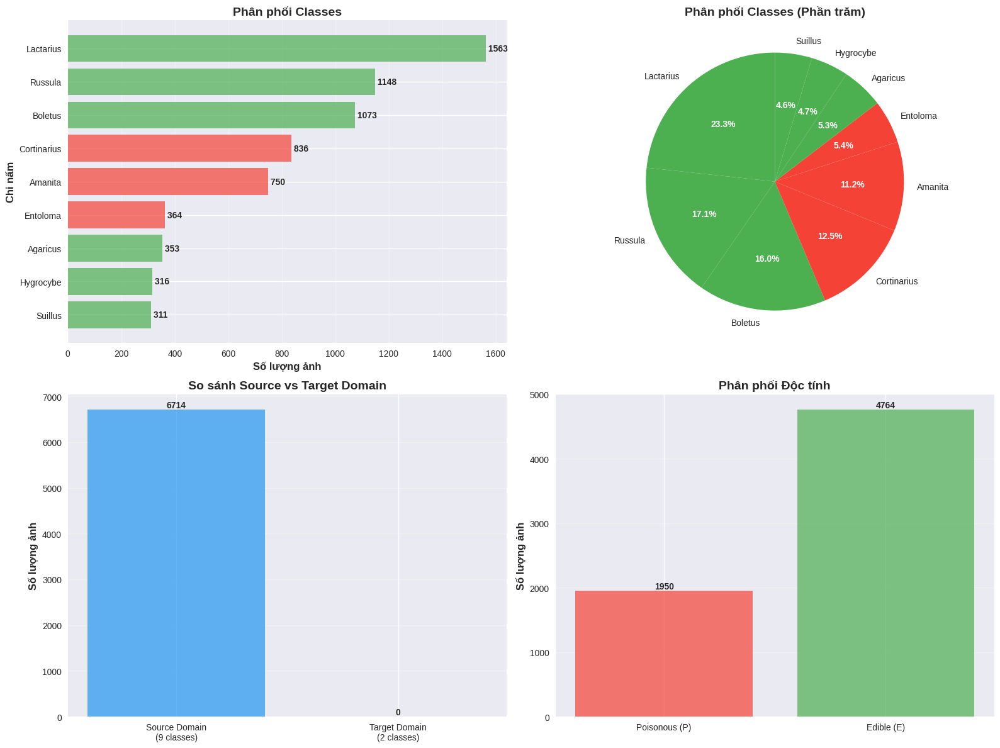

In [5]:
# ==================== VISUALIZE DATASET DISTRIBUTION ====================
# Tạo figure với 4 subplots để hiển thị các biểu đồ thống kê
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. Biểu đồ phân phối classes (Bar Chart ngang)
ax1 = axes[0, 0]
df_sorted = df_stats.sort_values('Count', ascending=True)
# Màu đỏ cho nấm độc, màu xanh cho nấm ăn được
colors = ['#f44336' if tox == 'P' else '#4caf50' for tox in df_sorted['Toxicity']]
ax1.barh(df_sorted['Genus'], df_sorted['Count'], color=colors, alpha=0.7)
ax1.set_xlabel('Số lượng ảnh', fontsize=12, fontweight='bold')
ax1.set_ylabel('Chi nấm', fontsize=12, fontweight='bold')
ax1.set_title('Phân phối Classes', fontsize=14, fontweight='bold')
ax1.grid(axis='x', alpha=0.3)
# Hiển thị số lượng trên mỗi thanh
for i, v in enumerate(df_sorted['Count']):
    ax1.text(v, i, f' {v}', va='center', fontweight='bold')

# 2. Biểu đồ tròn (Pie Chart) - Phân phối phần trăm
ax2 = axes[0, 1]
colors_pie = ['#f44336' if tox == 'P' else '#4caf50' for tox in df_stats['Toxicity']]
wedges, texts, autotexts = ax2.pie(df_stats['Count'], labels=df_stats['Genus'], 
                                    autopct='%1.1f%%', startangle=90, colors=colors_pie)
ax2.set_title('Phân phối Classes (Phần trăm)', fontsize=14, fontweight='bold')
for autotext in autotexts:
    autotext.set_color('white')
    autotext.set_fontweight('bold')

# 3. So sánh Source Domain vs Target Domain
ax3 = axes[1, 0]
domain_counts = [source_count, target_count]
domain_labels = ['Source Domain\n(9 classes)', 'Target Domain\n(2 classes)']
colors_domain = ['#2196F3', '#FF9800']
bars = ax3.bar(domain_labels, domain_counts, color=colors_domain, alpha=0.7)
ax3.set_ylabel('Số lượng ảnh', fontsize=12, fontweight='bold')
ax3.set_title('So sánh Source vs Target Domain', fontsize=14, fontweight='bold')
ax3.grid(axis='y', alpha=0.3)
for bar in bars:
    height = bar.get_height()
    ax3.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height)}', ha='center', va='bottom', fontweight='bold')

# 4. Phân phối độc tính
ax4 = axes[1, 1]
toxicity_counts = [poisonous_count, edible_count]
toxicity_labels = ['Poisonous (P)', 'Edible (E)']
colors_tox = ['#f44336', '#4caf50']
bars = ax4.bar(toxicity_labels, toxicity_counts, color=colors_tox, alpha=0.7)
ax4.set_ylabel('Số lượng ảnh', fontsize=12, fontweight='bold')
ax4.set_title('Phân phối Độc tính', fontsize=14, fontweight='bold')
ax4.grid(axis='y', alpha=0.3)
for bar in bars:
    height = bar.get_height()
    ax4.text(bar.get_x() + bar.get_width()/2., height,
             f'{int(height)}', ha='center', va='bottom', fontweight='bold')

plt.tight_layout()
plt.savefig(RESULTS_DIR / "dataset_exploration.png", dpi=300, bbox_inches='tight')
print(f"\nĐã lưu visualization tại: {RESULTS_DIR / 'dataset_exploration.png'}")
plt.show()



## Bước 4: Data Preprocessing

Tạo Dataset class, DataLoader với data augmentation cho training và validation.


In [6]:
# ==================== CUSTOM DATASET CLASS ====================
class MushroomDataset(Dataset):
    """
    Custom Dataset class cho ảnh nấm
    Kế thừa từ torch.utils.data.Dataset để tương thích với DataLoader
    """
    
    def __init__(self, image_paths, labels, transform=None):
        """
        Khởi tạo dataset
        
        Args:
            image_paths: Danh sách đường dẫn các file ảnh
            labels: Danh sách labels tương ứng
            transform: Các phép biến đổi ảnh (augmentation, normalization)
        """
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform
    
    def __len__(self):
        """Trả về số lượng ảnh trong dataset"""
        return len(self.image_paths)
    
    def __getitem__(self, idx):
        """
        Lấy một mẫu dữ liệu tại vị trí idx
        
        Args:
            idx: Chỉ số của mẫu cần lấy
        
        Returns:
            image: Ảnh đã được transform
            label: Label tương ứng
        """
        img_path = self.image_paths[idx]
        label = self.labels[idx]
        
        # Load ảnh, nếu lỗi thì tạo ảnh đen làm fallback
        try:
            image = Image.open(img_path).convert('RGB')
        except Exception as e:
            print(f"Error loading {img_path}: {e}")
            image = Image.new('RGB', (224, 224), color='black')
        
        # Áp dụng transform nếu có
        if self.transform:
            image = self.transform(image)
        
        return image, label

print("Dataset class đã được định nghĩa")



Dataset class đã được định nghĩa


In [7]:
# ==================== DATA TRANSFORMS ====================
# Định nghĩa các phép biến đổi ảnh cho training (có augmentation)
# Augmentation giúp tăng tính đa dạng của dữ liệu và giảm overfitting
train_transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize ảnh về 256x256
    transforms.RandomCrop(224),  # Random crop về 224x224
    transforms.RandomHorizontalFlip(p=0.5),  # Lật ngang ngẫu nhiên với xác suất 50%
    transforms.RandomRotation(15),  # Xoay ngẫu nhiên trong khoảng -15 đến +15 độ
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),  # Thay đổi độ sáng, tương phản, độ bão hòa
    transforms.ToTensor(),  # Chuyển từ PIL Image sang Tensor
    # Normalize theo mean và std của ImageNet (chuẩn cho pre-trained models)
    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                        std=[0.229, 0.224, 0.225])
])

# Định nghĩa các phép biến đổi cho validation và test (không có augmentation)
# Chỉ resize và normalize để đảm bảo tính nhất quán
val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize về 224x224
    transforms.ToTensor(),  # Chuyển sang Tensor
    # Normalize theo ImageNet standards
    transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                        std=[0.229, 0.224, 0.225])
])

print("Data transforms đã được định nghĩa")
print(f"  Training: {len(train_transform.transforms)} transforms (với augmentation)")
print(f"  Validation/Test: {len(val_test_transform.transforms)} transforms (không augmentation)")



Data transforms đã được định nghĩa
  Training: 7 transforms (với augmentation)
  Validation/Test: 3 transforms (không augmentation)


In [8]:
# ==================== SPLIT DATASET ====================
# Sửa lỗi Transformation Leakage: Chia image_paths và labels trước khi tạo dataset
# Sử dụng stratify để đảm bảo phân phối classes đồng đều trong train/val/test

# Chuyển labels sang numpy array để dùng với sklearn
labels_array = np.array(labels)

# Bước 1: Chia train và temp (val + test) với tỷ lệ 70/30
train_paths, temp_paths, train_labels, temp_labels = train_test_split(
    image_paths,
    labels_array,
    test_size=(TRAIN_CONFIG["val_split"] + TRAIN_CONFIG["test_split"]),
    random_state=TRAIN_CONFIG["random_seed"],
    stratify=labels_array  # Đảm bảo phân phối classes đồng đều
)

# Bước 2: Chia temp thành val và test với tỷ lệ 50/50 (tương đương 15%/15% của tổng)
val_paths, test_paths, val_labels, test_labels = train_test_split(
    temp_paths,
    temp_labels,
    test_size=0.5,  # 50% của temp = 15% của tổng
    random_state=TRAIN_CONFIG["random_seed"],
    stratify=temp_labels  # Đảm bảo phân phối classes đồng đều
)

# Bước 3: Tạo 3 dataset riêng biệt với transform tương ứng
# Mỗi dataset là đối tượng độc lập, không chia sẻ transform
train_dataset = MushroomDataset(train_paths, train_labels.tolist(), transform=train_transform)
val_dataset = MushroomDataset(val_paths, val_labels.tolist(), transform=val_test_transform)
test_dataset = MushroomDataset(test_paths, test_labels.tolist(), transform=val_test_transform)

total_size = len(image_paths)
print(f"Dataset đã được split (sử dụng stratify để đảm bảo phân phối đồng đều):")
print(f"  Train: {len(train_dataset)} images ({len(train_dataset)/total_size*100:.1f}%)")
print(f"  Validation: {len(val_dataset)} images ({len(val_dataset)/total_size*100:.1f}%)")
print(f"  Test: {len(test_dataset)} images ({len(test_dataset)/total_size*100:.1f}%)")



Dataset đã được split (sử dụng stratify để đảm bảo phân phối đồng đều):
  Train: 4699 images (70.0%)
  Validation: 1007 images (15.0%)
  Test: 1008 images (15.0%)


DataLoaders đã được tạo:
  Train batches: 294
  Validation batches: 63
  Test batches: 63

Sample batch shape: torch.Size([16, 3, 224, 224])


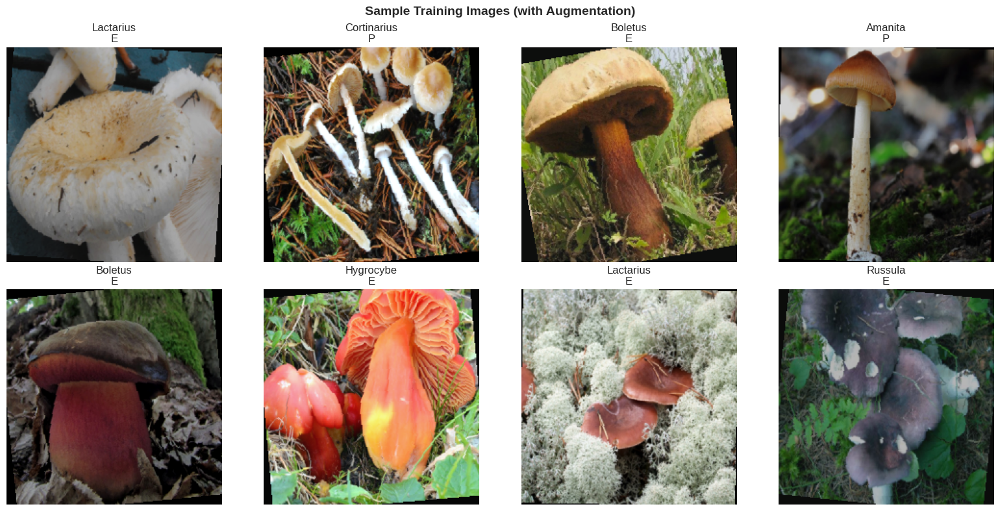

In [9]:
# ==================== CREATE DATALOADERS ====================
# Tạo DataLoader cho training set
# shuffle=True: xáo trộn dữ liệu mỗi epoch để tránh overfitting
# num_workers: sử dụng nhiều CPU cores để load data song song (tối ưu cho CPU)
# pin_memory=False: không cần pin memory vì không dùng GPU
train_loader = DataLoader(
    train_dataset,
    batch_size=TRAIN_CONFIG["batch_size"],
    shuffle=True,
    num_workers=TRAIN_CONFIG["num_workers"],
    pin_memory=False  # Không dùng pin_memory cho CPU
)

# Tạo DataLoader cho validation set
val_loader = DataLoader(
    val_dataset,
    batch_size=TRAIN_CONFIG["batch_size"],
    shuffle=False,  # Không shuffle cho validation
    num_workers=TRAIN_CONFIG["num_workers"],
    pin_memory=False
)

# Tạo DataLoader cho test set
test_loader = DataLoader(
    test_dataset,
    batch_size=TRAIN_CONFIG["batch_size"],
    shuffle=False,  # Không shuffle cho test
    num_workers=TRAIN_CONFIG["num_workers"],
    pin_memory=False
)

print("DataLoaders đã được tạo:")
print(f"  Train batches: {len(train_loader)}")
print(f"  Validation batches: {len(val_loader)}")
print(f"  Test batches: {len(test_loader)}")

# Hàm để hiển thị ảnh từ tensor (đã normalize)
def imshow(inp, title=None):
    """
    Hiển thị ảnh từ tensor đã được normalize
    
    Args:
        inp: Tensor ảnh (C, H, W)
        title: Tiêu đề cho ảnh
    """
    # Chuyển từ (C, H, W) sang (H, W, C) và convert sang numpy
    inp = inp.numpy().transpose((1, 2, 0))
    # Denormalize: nhân với std và cộng mean
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    # Đảm bảo giá trị trong khoảng [0, 1]
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.axis('off')

# Lấy một batch mẫu từ train_loader để visualize
images, labels_batch = next(iter(train_loader))
print(f"\nSample batch shape: {images.shape}")

# Hiển thị 8 ảnh mẫu từ batch
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.ravel()
for i in range(min(8, len(images))):
    # Denormalize và hiển thị ảnh
    img = images[i].numpy().transpose((1, 2, 0))
    img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
    img = np.clip(img, 0, 1)
    axes[i].imshow(img)
    # Hiển thị tên chi nấm và độc tính
    genus = IDX_TO_CLASS[labels_batch[i].item()]
    toxicity = TOXICITY_MAPPING[genus]
    axes[i].set_title(f"{genus}\n{toxicity}")
    axes[i].axis('off')
plt.suptitle('Sample Training Images (with Augmentation)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()



## Bước 5: Model Architecture

Xây dựng model với Transfer Learning sử dụng pre-trained ResNet50.


In [10]:
# ==================== MODEL ARCHITECTURE ====================
class MushroomClassifier(nn.Module):
    """
    Model phân loại nấm sử dụng Transfer Learning
    Sử dụng pre-trained backbone (ResNet50, EfficientNet, MobileNet) và thêm custom classifier head
    """
    
    def __init__(self, backbone="resnet50", num_classes=11, pretrained=True, freeze_backbone=False):
        """
        Khởi tạo model
        
        Args:
            backbone: Tên backbone model (resnet50, efficientnet_b0, mobilenet_v3_large)
            num_classes: Số lượng classes cần phân loại
            pretrained: Có sử dụng pre-trained weights từ ImageNet hay không
            freeze_backbone: Có đóng băng (freeze) backbone hay không
        """
        super(MushroomClassifier, self).__init__()
        
        self.backbone_name = backbone
        
        # Load backbone model với pre-trained weights
        if backbone == "resnet50":
            self.backbone = models.resnet50(pretrained=pretrained)
            num_features = self.backbone.fc.in_features
            # Thay thế lớp cuối bằng Identity để lấy features
            self.backbone.fc = nn.Identity()
        elif backbone == "efficientnet_b0":
            self.backbone = models.efficientnet_b0(pretrained=pretrained)
            num_features = self.backbone.classifier[1].in_features
            self.backbone.classifier = nn.Identity()
        elif backbone == "mobilenet_v3_large":
            # Sử dụng MobileNet_V3_Large_Weights.DEFAULT cho pre-trained weights
            if pretrained:
                self.backbone = models.mobilenet_v3_large(weights=MobileNet_V3_Large_Weights.DEFAULT)
            else:
                self.backbone = models.mobilenet_v3_large(weights=None)
            # MobileNetV3 Large có 960 features ở đầu ra
            num_features = self.backbone.classifier[0].in_features  # 960 features
            # Thay thế classifier bằng Identity để lấy features
            self.backbone.classifier = nn.Identity()
        else:
            raise ValueError(f"Unsupported backbone: {backbone}")
        
        # Đóng băng backbone nếu cần (chỉ train classifier head)
        if freeze_backbone:
            for param in self.backbone.parameters():
                param.requires_grad = False
        
        # Custom classifier head: thêm các lớp fully connected
        # Cấu trúc: Dropout -> Linear(960->512) -> ReLU -> Dropout -> Linear(512->num_classes)
        # num_features = 960 cho MobileNetV3 Large, 2048 cho ResNet50, 1280 cho EfficientNet
        self.classifier = nn.Sequential(
            nn.Dropout(0.5),  # Dropout để tránh overfitting
            nn.Linear(num_features, 512),  # Lớp ẩn: 960 -> 512 (MobileNetV3 Large)
            nn.ReLU(),  # Activation function
            nn.Dropout(0.3),  # Dropout thêm một lần nữa
            nn.Linear(512, num_classes)  # Lớp output: 512 -> num_classes (9 cho Phase 1)
        )
    
    def forward(self, x):
        """
        Forward pass của model
        
        Args:
            x: Input tensor (batch_size, 3, 224, 224)
        
        Returns:
            output: Logits cho mỗi class (batch_size, num_classes)
        """
        # Extract features từ backbone
        features = self.backbone(x)
        # Phân loại qua classifier head
        output = self.classifier(features)
        return output

# Tạo model với cấu hình đã định nghĩa
model = MushroomClassifier(
    backbone=MODEL_CONFIG["backbone"],
    num_classes=MODEL_CONFIG["num_classes"],
    pretrained=MODEL_CONFIG["pretrained"],
    freeze_backbone=MODEL_CONFIG["freeze_backbone"]
)

# Chuyển model lên device (CPU)
model = model.to(device)

# Đếm số lượng parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"Model đã được tạo:")
print(f"  Backbone: {MODEL_CONFIG['backbone']}")
print(f"  Total parameters: {total_params:,}")
print(f"  Trainable parameters: {trainable_params:,}")
print(f"  Frozen parameters: {total_params - trainable_params:,}")

# Test forward pass để đảm bảo model hoạt động đúng
print("\nKiểm tra forward pass:")
with torch.no_grad():
    test_input = torch.randn(1, 3, 224, 224).to(device)
    print(f"  Input shape: {test_input.shape}")
    test_output = model(test_input)
    print(f"  Output shape: {test_output.shape}")
    print(f"  Expected output: (1, {NUM_CLASSES}) - ✓ Model hoạt động đúng!")



Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-5c1a4163.pth" to /home/nam/.cache/torch/hub/checkpoints/mobilenet_v3_large-5c1a4163.pth


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 21.1M/21.1M [00:00<00:00, 43.1MB/s]


Model đã được tạo:
  Backbone: mobilenet_v3_large
  Total parameters: 3,468,601
  Trainable parameters: 3,468,601
  Frozen parameters: 0

Kiểm tra forward pass:
  Input shape: torch.Size([1, 3, 224, 224])
  Output shape: torch.Size([1, 9])
  Expected output: (1, 9) - ✓ Model hoạt động đúng!


In [11]:
# ==================== LOSS & OPTIMIZER ====================
# Tính toán class weights dựa trên độc tính (Cost-Sensitive Learning)
# False Negative (dự đoán nấm độc thành ăn được) là cực kỳ nguy hiểm
# Nên gán trọng số cao hơn cho các chi nấm độc

# Tính số lượng mẫu cho mỗi class trong training set
class_counts = Counter(train_labels)
print("Phân phối classes trong training set (Phase 1 - 9 lớp):")
classes_with_data = []  # Chỉ lưu các class có dữ liệu thực sự
for idx in range(NUM_CLASSES):
    genus = IDX_TO_CLASS[idx]
    count = class_counts.get(idx, 0)
    toxicity = TOXICITY_MAPPING[genus]
    if count > 0:  # CHỈ tính cho class có dữ liệu
        classes_with_data.append(idx)
        print(f"  {genus} ({toxicity}): {count} samples")
    else:
        print(f"  {genus} ({toxicity}): 0 samples (KHÔNG có trong training set)")

# Tính class weights: CHỈ tính cho các class có dữ liệu thực sự
# Loại bỏ hoàn toàn việc gán count=1 cho class có 0 mẫu
class_weights = torch.ones(NUM_CLASSES, dtype=torch.float32)
total_samples = len(train_labels)
num_classes_with_data = len(classes_with_data)

if num_classes_with_data > 0:
    # Tính weight cơ bản: tỷ lệ nghịch với số lượng mẫu (chỉ cho class có dữ liệu)
    for idx in classes_with_data:
        genus = IDX_TO_CLASS[idx]
        count = class_counts[idx]  # Không cần .get() vì đã kiểm tra count > 0
        # Weight cơ bản: tỷ lệ nghịch với số lượng mẫu
        weight = total_samples / (num_classes_with_data * count)
        
        # Nhân thêm 2.0 cho các chi nấm độc để tăng Recall
        if TOXICITY_MAPPING[genus] == "P":
            weight *= 2.0
        
        class_weights[idx] = weight
    
    # Normalize weights (chỉ normalize các weight đã được tính)
    sum_weights = class_weights[classes_with_data].sum()
    if sum_weights > 0:
        class_weights[classes_with_data] = class_weights[classes_with_data] / sum_weights * num_classes_with_data
else:
    print("CẢNH BÁO: Không có class nào có dữ liệu trong training set!")

print("\nClass weights (weights cao hơn cho nấm độc):")
for idx in range(NUM_CLASSES):
    genus = IDX_TO_CLASS[idx]
    toxicity = TOXICITY_MAPPING[genus]
    print(f"  {genus} ({toxicity}): {class_weights[idx]:.4f}")

# Loss function với class weights để tối ưu hóa Recall cho nấm độc
criterion = nn.CrossEntropyLoss(weight=class_weights.to(device))

# Optimizer: Adam với learning rate và weight decay
# Adam là optimizer phổ biến, hoạt động tốt cho cả CPU và GPU
optimizer = optim.Adam(
    model.parameters(),
    lr=TRAIN_CONFIG["learning_rate"],
    weight_decay=1e-4  # L2 regularization để tránh overfitting
)

# Learning rate scheduler: giảm learning rate khi validation loss không cải thiện
# Giúp model hội tụ tốt hơn và tránh overshooting
scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',  # Giảm LR khi loss giảm
    factor=0.5,  # Giảm LR đi một nửa
    patience=5  # Đợi 5 epochs không cải thiện thì giảm LR
)

print("\nLoss function (với class weights), optimizer và scheduler đã được setup")



Phân phối classes trong training set (Phase 1 - 9 lớp):
  Agaricus (E): 247 samples
  Amanita (P): 525 samples
  Boletus (E): 751 samples
  Cortinarius (P): 585 samples
  Entoloma (P): 255 samples
  Hygrocybe (E): 221 samples
  Lactarius (E): 1094 samples
  Russula (E): 803 samples
  Suillus (E): 218 samples

Class weights (weights cao hơn cho nấm độc):
  Agaricus (E): 1.1486
  Amanita (P): 1.0808
  Boletus (E): 0.3778
  Cortinarius (P): 0.9699
  Entoloma (P): 2.2251
  Hygrocybe (E): 1.2837
  Lactarius (E): 0.2593
  Russula (E): 0.3533
  Suillus (E): 1.3014

Loss function (với class weights), optimizer và scheduler đã được setup


In [12]:
# ==================== TRAINING FUNCTIONS ====================
def train_epoch(model, train_loader, criterion, optimizer, device):
    """
    Hàm training cho một epoch
    
    Args:
        model: Model cần train
        train_loader: DataLoader cho training set
        criterion: Loss function
        optimizer: Optimizer
        device: Device để chạy (CPU)
    
    Returns:
        epoch_loss: Average loss của epoch
        epoch_acc: Accuracy của epoch (%)
    """
    model.train()  # Chuyển model sang chế độ training
    running_loss = 0.0
    correct = 0
    total = 0
    
    # Dùng tqdm để hiển thị progress bar
    pbar = tqdm(train_loader, desc="Training")
    for images, labels in pbar:
        # Chuyển dữ liệu lên device
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass: tính toán output và loss
        optimizer.zero_grad()  # Reset gradients
        outputs = model(images)
        loss = criterion(outputs, labels)
        
        # Backward pass: tính gradients và cập nhật weights
        loss.backward()
        optimizer.step()
        
        # Tính toán statistics
        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)  # Lấy class có xác suất cao nhất
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        
        # Cập nhật progress bar với loss và accuracy hiện tại
        pbar.set_postfix({
            'loss': f'{loss.item():.4f}',
            'acc': f'{100 * correct / total:.2f}%'
        })
    
    # Tính average loss và accuracy cho toàn bộ epoch
    epoch_loss = running_loss / len(train_loader)
    epoch_acc = 100 * correct / total
    
    return epoch_loss, epoch_acc

def validate(model, val_loader, criterion, device):
    """
    Hàm validation cho một epoch
    
    Args:
        model: Model cần validate
        val_loader: DataLoader cho validation set
        criterion: Loss function
        device: Device để chạy (CPU)
    
    Returns:
        epoch_loss: Average loss của epoch
        epoch_acc: Accuracy của epoch (%)
    """
    model.eval()  # Chuyển model sang chế độ evaluation (không tính gradients)
    running_loss = 0.0
    correct = 0
    total = 0
    
    # Không tính gradients trong validation để tiết kiệm memory và tăng tốc
    with torch.no_grad():
        for images, labels in tqdm(val_loader, desc="Validating"):
            images = images.to(device)
            labels = labels.to(device)
            
            # Chỉ forward pass, không backward
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            # Tính toán statistics
            running_loss += loss.item()
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
    
    epoch_loss = running_loss / len(val_loader)
    epoch_acc = 100 * correct / total
    
    return epoch_loss, epoch_acc

print("Training functions đã được định nghĩa")



Training functions đã được định nghĩa


In [13]:
# ==================== TRAINING LOOP ====================
# Khởi tạo các biến để lưu lịch sử training
num_epochs = TRAIN_CONFIG["num_epochs"]
train_losses = []
train_accs = []
val_losses = []
val_accs = []
best_val_acc = 0.0
best_model_path = None

print(f"Bắt đầu training cho {num_epochs} epochs...")
print("="*70)

start_time = time.time()

# Vòng lặp training qua các epochs
for epoch in range(num_epochs):
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    print("-" * 70)
    
    # Training phase
    train_loss, train_acc = train_epoch(model, train_loader, criterion, optimizer, device)
    train_losses.append(train_loss)
    train_accs.append(train_acc)
    
    # Validation phase
    val_loss, val_acc = validate(model, val_loader, criterion, device)
    val_losses.append(val_loss)
    val_accs.append(val_acc)
    
    # Cập nhật learning rate dựa trên validation loss
    scheduler.step(val_loss)
    
    # In kết quả của epoch
    print(f"Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.2f}%")
    print(f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")
    
    # Lưu model tốt nhất (dựa trên validation accuracy)
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_model_path = MODELS_DIR / f"best_model_epoch_{epoch+1}.pth"
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),  # Lưu weights của model
            'optimizer_state_dict': optimizer.state_dict(),  # Lưu state của optimizer
            'val_acc': val_acc,
            'train_acc': train_acc,
            'config': MODEL_CONFIG  # Lưu cấu hình model
        }, best_model_path)
        print(f"Saved best model (Val Acc: {best_val_acc:.2f}%)")

# Tính thời gian training
elapsed_time = time.time() - start_time
print("\n" + "="*70)
print(f"Training hoàn tất trong {elapsed_time/60:.2f} phút!")
print(f"Best validation accuracy: {best_val_acc:.2f}%")
print(f"Best model saved at: {best_model_path}")



Bắt đầu training cho 50 epochs...

Epoch 1/50
----------------------------------------------------------------------


Training:  34%|█████████████████████████████▏                                                       | 101/294 [01:45<03:23,  1.05s/it, loss=1.1613, acc=32.86%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.02it/s]


Train Loss: 1.3324, Train Acc: 49.50%
Val Loss: 1.2730, Val Acc: 55.41%
Saved best model (Val Acc: 55.41%)

Epoch 2/50
----------------------------------------------------------------------


Training:  70%|███████████████████████████████████████████████████████████▊                         | 207/294 [03:36<01:28,  1.02s/it, loss=0.7737, acc=68.00%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:21<00:00,  2.98it/s]


Train Loss: 0.8634, Train Acc: 67.95%
Val Loss: 1.1323, Val Acc: 67.33%
Saved best model (Val Acc: 67.33%)

Epoch 3/50
----------------------------------------------------------------------


Training:  59%|█████████████████████████████████████████████████▋                                   | 172/294 [03:00<02:08,  1.05s/it, loss=0.6417, acc=75.40%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.03it/s]


Train Loss: 0.6865, Train Acc: 74.40%
Val Loss: 0.9257, Val Acc: 67.43%
Saved best model (Val Acc: 67.43%)

Epoch 4/50
----------------------------------------------------------------------


Training:  67%|████████████████████████████████████████████████████████▉                            | 197/294 [03:25<01:41,  1.05s/it, loss=0.1785, acc=77.89%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.02it/s]


Train Loss: 0.5888, Train Acc: 77.78%
Val Loss: 0.7470, Val Acc: 73.98%
Saved best model (Val Acc: 73.98%)

Epoch 5/50
----------------------------------------------------------------------


Training:  52%|███████████████████████████████████████████▉                                         | 152/294 [02:39<02:22,  1.01s/it, loss=0.3261, acc=78.17%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.01it/s]


Train Loss: 0.5562, Train Acc: 78.87%
Val Loss: 0.8967, Val Acc: 76.07%
Saved best model (Val Acc: 76.07%)

Epoch 6/50
----------------------------------------------------------------------


Training:   0%|                                                                                                                        | 0/294 [00:00<?, ?it/s]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:21<00:00,  2.96it/s]


Train Loss: 0.5222, Train Acc: 80.27%
Val Loss: 0.7334, Val Acc: 71.80%

Epoch 7/50
----------------------------------------------------------------------


Training:  36%|██████████████████████████████▋                                                      | 106/294 [01:51<03:11,  1.02s/it, loss=1.1280, acc=81.84%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.02it/s]


Train Loss: 0.5063, Train Acc: 80.40%
Val Loss: 0.7915, Val Acc: 73.78%

Epoch 8/50
----------------------------------------------------------------------


Training:  27%|███████████████████████                                                               | 79/294 [01:22<03:41,  1.03s/it, loss=0.5307, acc=83.07%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:21<00:00,  2.89it/s]


Train Loss: 0.4462, Train Acc: 82.68%
Val Loss: 0.9572, Val Acc: 70.11%

Epoch 9/50
----------------------------------------------------------------------


Training:  91%|█████████████████████████████████████████████████████████████████████████████▍       | 268/294 [04:39<00:25,  1.03it/s, loss=0.2056, acc=83.51%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.11it/s]


Train Loss: 0.4116, Train Acc: 83.44%
Val Loss: 0.7083, Val Acc: 75.47%

Epoch 10/50
----------------------------------------------------------------------


Training:   1%|▌                                                                                      | 2/294 [00:03<08:18,  1.71s/it, loss=0.4158, acc=78.12%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.03it/s]


Train Loss: 0.3681, Train Acc: 84.89%
Val Loss: 0.7918, Val Acc: 78.55%
Saved best model (Val Acc: 78.55%)

Epoch 11/50
----------------------------------------------------------------------


Training:  52%|████████████████████████████████████████████▏                                        | 153/294 [02:40<02:30,  1.07s/it, loss=0.5243, acc=86.64%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.01it/s]


Train Loss: 0.3927, Train Acc: 85.53%
Val Loss: 0.7408, Val Acc: 80.34%
Saved best model (Val Acc: 80.34%)

Epoch 12/50
----------------------------------------------------------------------


Training:  82%|█████████████████████████████████████████████████████████████████████▋               | 241/294 [04:11<00:54,  1.02s/it, loss=0.1400, acc=84.28%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.02it/s]


Train Loss: 0.4186, Train Acc: 83.76%
Val Loss: 1.0806, Val Acc: 68.62%

Epoch 13/50
----------------------------------------------------------------------


Training:  81%|█████████████████████████████████████████████████████████████████████                | 239/294 [04:08<00:54,  1.01it/s, loss=0.3039, acc=86.30%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.08it/s]


Train Loss: 0.3470, Train Acc: 86.27%
Val Loss: 0.7567, Val Acc: 67.83%

Epoch 14/50
----------------------------------------------------------------------


Training:  25%|█████████████████████▋                                                                | 74/294 [01:18<03:39,  1.00it/s, loss=1.2186, acc=88.34%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:21<00:00,  3.00it/s]


Train Loss: 0.3659, Train Acc: 86.74%
Val Loss: 0.7754, Val Acc: 78.95%

Epoch 15/50
----------------------------------------------------------------------


Training:   0%|                                                                                                                        | 0/294 [00:00<?, ?it/s]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.02it/s]


Train Loss: 0.3084, Train Acc: 87.34%
Val Loss: 0.8251, Val Acc: 76.96%

Epoch 16/50
----------------------------------------------------------------------


Training:  83%|██████████████████████████████████████████████████████████████████████▌              | 244/294 [04:14<00:50,  1.01s/it, loss=0.1668, acc=92.49%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.01it/s]


Train Loss: 0.1674, Train Acc: 92.68%
Val Loss: 0.4938, Val Acc: 86.59%
Saved best model (Val Acc: 86.59%)

Epoch 17/50
----------------------------------------------------------------------


Training:  24%|█████████████████████                                                                 | 72/294 [01:16<03:50,  1.04s/it, loss=0.0634, acc=95.31%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.06it/s]


Train Loss: 0.1290, Train Acc: 94.17%
Val Loss: 0.5037, Val Acc: 85.00%

Epoch 18/50
----------------------------------------------------------------------


Training:  19%|████████████████▍                                                                     | 56/294 [01:00<04:04,  1.03s/it, loss=0.3409, acc=94.20%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.03it/s]


Train Loss: 0.1481, Train Acc: 93.40%
Val Loss: 0.5029, Val Acc: 83.22%

Epoch 19/50
----------------------------------------------------------------------


Training:  35%|██████████████████████████████                                                       | 104/294 [01:48<03:13,  1.02s/it, loss=0.1039, acc=93.99%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.01it/s]


Train Loss: 0.1330, Train Acc: 93.64%
Val Loss: 0.6816, Val Acc: 82.82%

Epoch 20/50
----------------------------------------------------------------------


Training:  67%|████████████████████████████████████████████████████████▋                            | 196/294 [03:23<01:37,  1.00it/s, loss=0.0234, acc=94.07%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.09it/s]


Train Loss: 0.1210, Train Acc: 93.98%
Val Loss: 0.5756, Val Acc: 85.80%

Epoch 21/50
----------------------------------------------------------------------


Training:  22%|███████████████████                                                                   | 65/294 [01:08<03:45,  1.01it/s, loss=0.0013, acc=95.67%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.01it/s]


Train Loss: 0.1112, Train Acc: 94.94%
Val Loss: 0.5526, Val Acc: 85.80%

Epoch 22/50
----------------------------------------------------------------------


Training:   0%|                                                                                                                        | 0/294 [00:00<?, ?it/s]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.02it/s]


Train Loss: 0.1022, Train Acc: 95.15%
Val Loss: 0.4877, Val Acc: 87.49%
Saved best model (Val Acc: 87.49%)

Epoch 23/50
----------------------------------------------------------------------


Training:  22%|██████████████████▋                                                                   | 64/294 [01:08<04:07,  1.08s/it, loss=0.0709, acc=96.29%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.04it/s]


Train Loss: 0.0953, Train Acc: 95.91%
Val Loss: 0.6962, Val Acc: 84.51%

Epoch 24/50
----------------------------------------------------------------------


Training:  36%|██████████████████████████████▎                                                      | 105/294 [01:52<03:28,  1.10s/it, loss=0.1650, acc=94.29%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.01it/s]


Train Loss: 0.1512, Train Acc: 93.98%
Val Loss: 0.5764, Val Acc: 82.52%

Epoch 25/50
----------------------------------------------------------------------


Training:  12%|█████████▉                                                                            | 34/294 [00:37<04:20,  1.00s/it, loss=0.0289, acc=93.75%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:21<00:00,  2.99it/s]


Train Loss: 0.1321, Train Acc: 94.83%
Val Loss: 0.6994, Val Acc: 84.61%

Epoch 26/50
----------------------------------------------------------------------


Training:  70%|███████████████████████████████████████████████████████████▌                         | 206/294 [03:37<01:38,  1.12s/it, loss=0.0166, acc=95.30%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.02it/s]


Train Loss: 0.0864, Train Acc: 95.68%
Val Loss: 0.5558, Val Acc: 85.00%

Epoch 27/50
----------------------------------------------------------------------


Training:  54%|█████████████████████████████████████████████▋                                       | 158/294 [02:44<02:11,  1.03it/s, loss=0.0126, acc=95.81%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.03it/s]


Train Loss: 0.1080, Train Acc: 95.23%
Val Loss: 0.7011, Val Acc: 82.52%

Epoch 28/50
----------------------------------------------------------------------


Training:  17%|██████████████▉                                                                       | 51/294 [00:55<04:30,  1.11s/it, loss=0.1536, acc=95.22%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.07it/s]


Train Loss: 0.1241, Train Acc: 94.34%
Val Loss: 0.6618, Val Acc: 84.31%

Epoch 29/50
----------------------------------------------------------------------


Training:  42%|███████████████████████████████████▊                                                 | 124/294 [02:11<03:01,  1.07s/it, loss=0.1099, acc=95.56%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.01it/s]


Train Loss: 0.0675, Train Acc: 96.19%
Val Loss: 0.5532, Val Acc: 86.10%

Epoch 30/50
----------------------------------------------------------------------


Training:  37%|███████████████████████████████▊                                                     | 110/294 [01:57<03:11,  1.04s/it, loss=0.0367, acc=98.01%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:21<00:00,  2.94it/s]


Train Loss: 0.0429, Train Acc: 98.00%
Val Loss: 0.5698, Val Acc: 88.58%
Saved best model (Val Acc: 88.58%)

Epoch 31/50
----------------------------------------------------------------------


Training:  83%|██████████████████████████████████████████████████████████████████████▌              | 244/294 [04:16<00:55,  1.11s/it, loss=0.0075, acc=98.10%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.01it/s]


Train Loss: 0.0418, Train Acc: 98.08%
Val Loss: 0.5817, Val Acc: 86.40%

Epoch 32/50
----------------------------------------------------------------------


Training:  35%|██████████████████████████████                                                       | 104/294 [01:50<03:25,  1.08s/it, loss=0.1967, acc=98.26%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.05it/s]


Train Loss: 0.0382, Train Acc: 97.83%
Val Loss: 0.6319, Val Acc: 88.08%

Epoch 33/50
----------------------------------------------------------------------


Training:  15%|█████████████▏                                                                        | 45/294 [00:48<04:20,  1.05s/it, loss=0.1556, acc=98.61%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.00it/s]


Train Loss: 0.0401, Train Acc: 98.36%
Val Loss: 0.6677, Val Acc: 87.79%

Epoch 34/50
----------------------------------------------------------------------


Training:  82%|█████████████████████████████████████████████████████████████████████▋               | 241/294 [04:13<00:54,  1.03s/it, loss=0.0478, acc=98.26%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.01it/s]


Train Loss: 0.0290, Train Acc: 98.40%
Val Loss: 0.6048, Val Acc: 88.58%

Epoch 35/50
----------------------------------------------------------------------


Training:  84%|███████████████████████████████████████████████████████████████████████▍             | 247/294 [04:21<00:50,  1.08s/it, loss=0.0010, acc=98.51%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.03it/s]


Train Loss: 0.0254, Train Acc: 98.64%
Val Loss: 0.5943, Val Acc: 89.87%
Saved best model (Val Acc: 89.87%)

Epoch 36/50
----------------------------------------------------------------------


Training:   5%|████▋                                                                                 | 16/294 [00:18<04:54,  1.06s/it, loss=0.0099, acc=99.22%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.02it/s]


Train Loss: 0.0204, Train Acc: 98.89%
Val Loss: 0.5777, Val Acc: 89.18%

Epoch 37/50
----------------------------------------------------------------------


Training:   4%|███▌                                                                                  | 12/294 [00:14<04:57,  1.05s/it, loss=0.0005, acc=98.96%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.06it/s]


Train Loss: 0.0259, Train Acc: 98.72%
Val Loss: 0.5522, Val Acc: 88.58%

Epoch 38/50
----------------------------------------------------------------------


Training:   9%|███████▌                                                                              | 26/294 [00:28<04:38,  1.04s/it, loss=0.0013, acc=98.08%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.04it/s]


Train Loss: 0.0244, Train Acc: 98.68%
Val Loss: 0.5053, Val Acc: 89.67%

Epoch 39/50
----------------------------------------------------------------------


Training:  13%|██████████▊                                                                           | 37/294 [00:40<04:25,  1.03s/it, loss=0.0014, acc=99.32%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.04it/s]


Train Loss: 0.0118, Train Acc: 99.34%
Val Loss: 0.5164, Val Acc: 88.58%

Epoch 40/50
----------------------------------------------------------------------


Training:  91%|█████████████████████████████████████████████████████████████████████████████▏       | 267/294 [04:42<00:27,  1.02s/it, loss=0.0085, acc=99.16%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:21<00:00,  2.99it/s]


Train Loss: 0.0127, Train Acc: 99.15%
Val Loss: 0.5219, Val Acc: 88.98%

Epoch 41/50
----------------------------------------------------------------------


Training:   7%|█████▊                                                                                | 20/294 [00:23<04:58,  1.09s/it, loss=0.0005, acc=99.06%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:21<00:00,  3.00it/s]


Train Loss: 0.0140, Train Acc: 99.30%
Val Loss: 0.5675, Val Acc: 89.97%
Saved best model (Val Acc: 89.97%)

Epoch 42/50
----------------------------------------------------------------------


Training:  44%|█████████████████████████████████████▌                                               | 130/294 [02:18<02:52,  1.05s/it, loss=0.0001, acc=99.57%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.02it/s]


Train Loss: 0.0162, Train Acc: 99.32%
Val Loss: 0.5593, Val Acc: 89.67%

Epoch 43/50
----------------------------------------------------------------------


Training:  82%|█████████████████████████████████████████████████████████████████████▋               | 241/294 [04:13<00:53,  1.01s/it, loss=0.0001, acc=99.46%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.00it/s]


Train Loss: 0.0098, Train Acc: 99.47%
Val Loss: 0.5310, Val Acc: 89.87%

Epoch 44/50
----------------------------------------------------------------------


Training:  77%|█████████████████████████████████████████████████████████████████▋                   | 227/294 [03:59<01:10,  1.06s/it, loss=0.0073, acc=99.26%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:22<00:00,  2.86it/s]


Train Loss: 0.0144, Train Acc: 99.36%
Val Loss: 0.5798, Val Acc: 89.67%

Epoch 45/50
----------------------------------------------------------------------


Training:  14%|████████████▎                                                                         | 42/294 [00:45<04:14,  1.01s/it, loss=0.0007, acc=99.70%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:21<00:00,  2.96it/s]


Train Loss: 0.0117, Train Acc: 99.40%
Val Loss: 0.5319, Val Acc: 89.57%

Epoch 46/50
----------------------------------------------------------------------


Training:  48%|████████████████████████████████████████▊                                            | 141/294 [02:30<02:31,  1.01it/s, loss=0.0003, acc=99.56%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:21<00:00,  2.96it/s]


Train Loss: 0.0110, Train Acc: 99.47%
Val Loss: 0.5154, Val Acc: 89.47%

Epoch 47/50
----------------------------------------------------------------------


Training:  64%|██████████████████████████████████████████████████████                               | 187/294 [03:18<01:51,  1.04s/it, loss=0.0004, acc=99.57%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.01it/s]


Train Loss: 0.0116, Train Acc: 99.49%
Val Loss: 0.5387, Val Acc: 89.37%

Epoch 48/50
----------------------------------------------------------------------


Training:   9%|███████▉                                                                              | 27/294 [00:29<04:28,  1.00s/it, loss=0.0003, acc=99.54%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.01it/s]


Train Loss: 0.0109, Train Acc: 99.51%
Val Loss: 0.5064, Val Acc: 89.47%

Epoch 49/50
----------------------------------------------------------------------


Training:  84%|███████████████████████████████████████████████████████████████████████              | 246/294 [04:22<00:56,  1.17s/it, loss=0.0220, acc=99.57%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:21<00:00,  3.00it/s]


Train Loss: 0.0096, Train Acc: 99.55%
Val Loss: 0.5158, Val Acc: 89.57%

Epoch 50/50
----------------------------------------------------------------------


Training:  18%|███████████████▊                                                                      | 54/294 [00:59<04:21,  1.09s/it, loss=0.0006, acc=99.54%]

Error loading /home/nam/mushroom_data/archive/Mushrooms/Russula/092_43B354vYxm8.jpg: image file is truncated (92 bytes not processed)


Validating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.05it/s]

Train Loss: 0.0120, Train Acc: 99.43%
Val Loss: 0.5108, Val Acc: 89.37%

Training hoàn tất trong 271.31 phút!
Best validation accuracy: 89.97%
Best model saved at: /home/nam/mushroom_data/models/best_model_epoch_41.pth


Training history saved to: /home/nam/mushroom_data/results/training_history.png


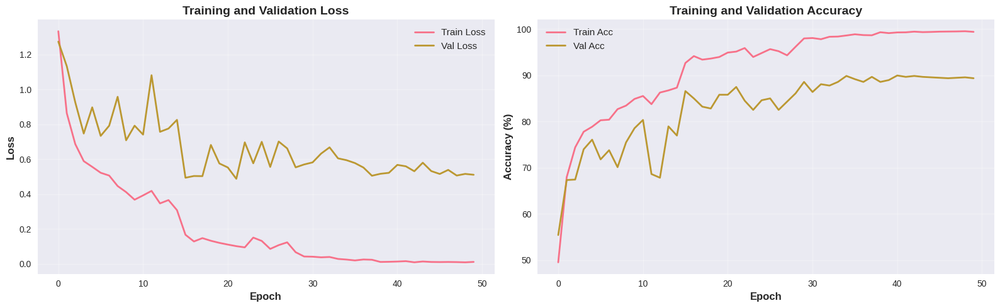

In [14]:
# ==================== VISUALIZE TRAINING HISTORY ====================
# Tạo figure với 2 subplots: một cho loss, một cho accuracy
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))

# Biểu đồ Loss: so sánh train loss và validation loss qua các epochs
ax1.plot(train_losses, label='Train Loss', linewidth=2)
ax1.plot(val_losses, label='Val Loss', linewidth=2)
ax1.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax1.set_ylabel('Loss', fontsize=12, fontweight='bold')
ax1.set_title('Training and Validation Loss', fontsize=14, fontweight='bold')
ax1.legend(fontsize=11)
ax1.grid(True, alpha=0.3)

# Biểu đồ Accuracy: so sánh train accuracy và validation accuracy qua các epochs
ax2.plot(train_accs, label='Train Acc', linewidth=2)
ax2.plot(val_accs, label='Val Acc', linewidth=2)
ax2.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax2.set_ylabel('Accuracy (%)', fontsize=12, fontweight='bold')
ax2.set_title('Training and Validation Accuracy', fontsize=14, fontweight='bold')
ax2.legend(fontsize=11)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(RESULTS_DIR / "training_history.png", dpi=300, bbox_inches='tight')
print(f"Training history saved to: {RESULTS_DIR / 'training_history.png'}")
plt.show()



## Bước 7: Evaluation

Đánh giá model trên test set với metrics chi tiết và confusion matrix.


In [15]:
# ==================== LOAD BEST MODEL ====================
# Load model tốt nhất đã được lưu trong quá trình training
if best_model_path and best_model_path.exists():
    checkpoint = torch.load(best_model_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    print(f"Đã load best model từ epoch {checkpoint['epoch']+1}")
    print(f"   Validation accuracy: {checkpoint['val_acc']:.2f}%")
else:
    print("Không tìm thấy best model, sử dụng model hiện tại")



Đã load best model từ epoch 41
   Validation accuracy: 89.97%


In [16]:
# ==================== EVALUATE ON TEST SET ====================
# Đánh giá model trên test set (dữ liệu chưa từng thấy trong training)
model.eval()  # Chuyển sang chế độ evaluation
all_preds = []  # Lưu tất cả predictions
all_labels = []  # Lưu tất cả true labels
all_probs = []  # Lưu tất cả probabilities

print("Đang đánh giá trên test set...")
with torch.no_grad():  # Không tính gradients để tiết kiệm memory
    for images, labels in tqdm(test_loader, desc="Evaluating"):
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs = model(images)
        probs = F.softmax(outputs, dim=1)  # Chuyển logits sang probabilities
        _, preds = torch.max(outputs, 1)  # Lấy class có xác suất cao nhất
        
        # Lưu kết quả (chuyển về CPU và numpy)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        all_probs.extend(probs.cpu().numpy())

# Chuyển sang numpy array để dễ xử lý
all_preds = np.array(all_preds)
all_labels = np.array(all_labels)
all_probs = np.array(all_probs)

# Tính accuracy trên test set
test_accuracy = accuracy_score(all_labels, all_preds)
print(f"\nTest Accuracy: {test_accuracy*100:.2f}%")



Đang đánh giá trên test set...


Evaluating: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.05it/s]


Test Accuracy: 91.37%


In [ ]:
# ==================== CLASSIFICATION REPORT ====================
print("\n" + "="*70)
print("CLASSIFICATION REPORT")
print("="*70)

report = classification_report(
    all_labels,
    all_preds,
    target_names=ALL_CLASSES,
    output_dict=True
)

# Print detailed report
print(f"\nOverall Accuracy: {report['accuracy']:.4f}")
print(f"\nPer-Class Metrics:")
print("-"*70)
print(f"{'Class':<20} {'Precision':<12} {'Recall':<12} {'F1-Score':<12} {'Support':<10}")
print("-"*70)

for class_name in ALL_CLASSES:
    if class_name in report:
        metrics = report[class_name]
        print(f"{class_name:<20} {metrics['precision']:<12.4f} {metrics['recall']:<12.4f} "
              f"{metrics['f1-score']:<12.4f} {int(metrics['support']):<10}")

print("-"*70)
print(f"{'Macro Avg':<20} {report['macro avg']['precision']:<12.4f} "
      f"{report['macro avg']['recall']:<12.4f} {report['macro avg']['f1-score']:<12.4f} "
      f"{int(report['macro avg']['support']):<10}")
print(f"{'Weighted Avg':<20} {report['weighted avg']['precision']:<12.4f} "
      f"{report['weighted avg']['recall']:<12.4f} {report['weighted avg']['f1-score']:<12.4f} "
      f"{int(report['weighted avg']['support']):<10}")
print("="*70)

#f1 = 2 . (tích)/tổng


CLASSIFICATION REPORT

Overall Accuracy: 0.9137

Per-Class Metrics:
----------------------------------------------------------------------
Class                Precision    Recall       F1-Score     Support   
----------------------------------------------------------------------
Agaricus             0.8596       0.9245       0.8909       53        
Amanita              0.9369       0.9204       0.9286       113       
Boletus              0.9684       0.9503       0.9592       161       
Cortinarius          0.9907       0.8492       0.9145       126       
Entoloma             0.8070       0.8519       0.8288       54        
Hygrocybe            0.9318       0.8723       0.9011       47        
Lactarius            0.8980       0.9362       0.9167       235       
Russula              0.9091       0.9249       0.9169       173       
Suillus              0.7885       0.8913       0.8367       46        
----------------------------------------------------------------------
Macro Av

## Bước 7.5: Feature Analytics (Khai phá đặc trưng)

Trích xuất feature vectors từ model và phân tích bằng k-Means clustering và t-SNE visualization.


In [18]:
# ==================== FEATURE EXTRACTION ====================
# Trích xuất feature vectors từ tầng trước classifier
# ResNet50: từ avgpool layer (2048 features)
# MobileNetV3: từ adaptive_avg_pool2d (960 features)
# Để phân tích đặc trưng và clustering

def extract_features(model, data_loader, device):
    """
    Trích xuất feature vectors từ model
    
    Args:
        model: Model đã được train
        data_loader: DataLoader cho dataset
        device: Device để chạy (CPU)
    
    Returns:
        features: Feature vectors (n_samples, feature_dim)
        labels: True labels
    """
    model.eval()
    features_list = []
    labels_list = []
    
    # Hook để lấy features từ tầng avgpool
    def hook_fn(module, input, output):
        features_list.append(output.cpu().numpy())
    
    # Đăng ký hook để lấy features từ backbone
    if MODEL_CONFIG["backbone"] == "resnet50":
        # ResNet50: lấy từ avgpool layer
        handle = model.backbone.avgpool.register_forward_hook(hook_fn)
    elif MODEL_CONFIG["backbone"] == "mobilenet_v3_large":
        # MobileNetV3: lấy từ adaptive_avg_pool2d (trước classifier)
        # Tìm layer adaptive_avg_pool2d trong backbone
        for name, module in model.backbone.named_modules():
            if isinstance(module, nn.AdaptiveAvgPool2d):
                handle = module.register_forward_hook(hook_fn)
                break
    else:
        # Nếu dùng backbone khác, lấy từ tầng trước classifier
        handle = model.backbone.register_forward_hook(hook_fn)
    
    print("Đang trích xuất features...")
    with torch.no_grad():
        for images, labels in tqdm(data_loader, desc="Extracting features"):
            images = images.to(device)
            _ = model(images)  # Forward pass để trigger hook
            labels_list.extend(labels.numpy())
    
    # Gỡ hook
    handle.remove()
    
    # Kết hợp tất cả features
    features = np.vstack(features_list)
    labels = np.array(labels_list)
    
    # Flatten features nếu cần
    # ResNet50 avgpool: (batch, 2048, 1, 1) -> (batch, 2048)
    # MobileNetV3: (batch, 960, 1, 1) -> (batch, 960)
    if len(features.shape) > 2:
        features = features.reshape(features.shape[0], -1)
    
    return features, labels

# Trích xuất features từ test set
test_features, test_labels_extracted = extract_features(model, test_loader, device)
print(f"\nFeature vectors shape: {test_features.shape}")
print(f"Labels shape: {test_labels_extracted.shape}")

# Tạo toxicity labels từ class labels
toxicity_labels = np.array([TOXICITY_MAPPING[IDX_TO_CLASS[label]] for label in test_labels_extracted])
print(f"Toxicity labels: {np.unique(toxicity_labels, return_counts=True)}")


Đang trích xuất features...


Extracting features: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 63/63 [00:20<00:00,  3.05it/s]


Feature vectors shape: (1008, 72)
Labels shape: (1008,)
Toxicity labels: (array(['E', 'P'], dtype='<U1'), array([715, 293]))


In [19]:
# ==================== K-MEANS CLUSTERING ====================
# Sử dụng k-Means để gom cụm các feature vectors
# Thử với số cụm khác nhau dựa trên số lượng classes

# Thử với số cụm = số classes (11)
n_clusters = NUM_CLASSES
kmeans = KMeans(n_clusters=n_clusters, random_state=RANDOM_SEED, n_init=10)
cluster_labels = kmeans.fit_predict(test_features)

print(f"K-Means clustering hoàn tất với {n_clusters} cụm")
print(f"Cluster centers shape: {kmeans.cluster_centers_.shape}")

# Phân tích kết quả clustering
print("\nPhân tích clustering:")
print("-"*50)
for i in range(n_clusters):
    cluster_mask = cluster_labels == i
    cluster_size = cluster_mask.sum()
    if cluster_size > 0:
        # Tìm class phổ biến nhất trong cụm
        classes_in_cluster = test_labels_extracted[cluster_mask]
        most_common_class = Counter(classes_in_cluster).most_common(1)[0]
        class_name = IDX_TO_CLASS[most_common_class[0]]
        toxicity = TOXICITY_MAPPING[class_name]
        print(f"Cụm {i}: {cluster_size} mẫu, class phổ biến: {class_name} ({toxicity})")


K-Means clustering hoàn tất với 9 cụm
Cluster centers shape: (9, 72)

Phân tích clustering:
--------------------------------------------------
Cụm 0: 140 mẫu, class phổ biến: Boletus (E)
Cụm 1: 184 mẫu, class phổ biến: Lactarius (E)
Cụm 2: 11 mẫu, class phổ biến: Lactarius (E)
Cụm 3: 183 mẫu, class phổ biến: Lactarius (E)
Cụm 4: 127 mẫu, class phổ biến: Boletus (E)
Cụm 5: 109 mẫu, class phổ biến: Boletus (E)
Cụm 6: 19 mẫu, class phổ biến: Russula (E)
Cụm 7: 59 mẫu, class phổ biến: Russula (E)
Cụm 8: 176 mẫu, class phổ biến: Lactarius (E)


Đang chạy t-SNE (có thể mất vài phút)...
t-SNE hoàn tất!

Đã lưu t-SNE visualization tại: /home/nam/mushroom_data/results/tsne_visualization.png


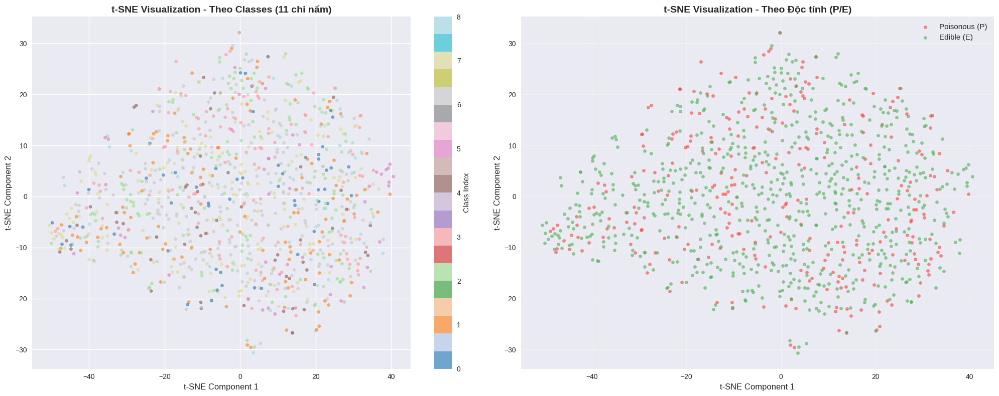


Phân tích phân bố theo độc tính:
  Nấm độc (P): 293 mẫu
  Nấm ăn được (E): 715 mẫu
  Trung bình tọa độ t-SNE của nấm độc: (-0.58, -0.09)
  Trung bình tọa độ t-SNE của nấm ăn được: (-1.02, -0.07)


In [21]:
# ==================== VISUALIZATION VỚI t-SNE ====================
# Sử dụng t-SNE để giảm chiều feature vectors xuống 2D để visualize
print("Đang chạy t-SNE (có thể mất vài phút)...")
# Lưu ý: Trong scikit-learn mới, n_iter đã đổi thành max_iter
tsne = TSNE(n_components=2, random_state=RANDOM_SEED, perplexity=30, max_iter=1000)
features_2d = tsne.fit_transform(test_features)

print("t-SNE hoàn tất!")

# Tạo figure với 2 subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Subplot 1: Visualize theo True Labels (Classes)
ax1 = axes[0]
scatter = ax1.scatter(features_2d[:, 0], features_2d[:, 1], 
                      c=test_labels_extracted, cmap='tab20', 
                      alpha=0.6, s=20)
ax1.set_title('t-SNE Visualization - Theo Classes (11 chi nấm)', 
              fontsize=14, fontweight='bold')
ax1.set_xlabel('t-SNE Component 1', fontsize=12)
ax1.set_ylabel('t-SNE Component 2', fontsize=12)
plt.colorbar(scatter, ax=ax1, label='Class Index')

# Subplot 2: Visualize theo Toxicity (P/E) - QUAN TRỌNG
ax2 = axes[1]
# Màu đỏ cho nấm độc (P), xanh cho nấm ăn được (E)
colors_tox = ['#f44336' if tox == 'P' else '#4caf50' for tox in toxicity_labels]
for i, (tox, color) in enumerate(zip(['P', 'E'], ['#f44336', '#4caf50'])):
    mask = toxicity_labels == tox
    ax2.scatter(features_2d[mask, 0], features_2d[mask, 1], 
                c=color, label=f'{"Poisonous" if tox == "P" else "Edible"} ({tox})',
                alpha=0.6, s=20)
ax2.set_title('t-SNE Visualization - Theo Độc tính (P/E)', 
              fontsize=14, fontweight='bold')
ax2.set_xlabel('t-SNE Component 1', fontsize=12)
ax2.set_ylabel('t-SNE Component 2', fontsize=12)
ax2.legend(fontsize=11)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(RESULTS_DIR / "tsne_visualization.png", dpi=300, bbox_inches='tight')
print(f"\nĐã lưu t-SNE visualization tại: {RESULTS_DIR / 'tsne_visualization.png'}")
plt.show()

# Phân tích: Kiểm tra xem nấm độc có tập trung lại một khu vực không
print("\nPhân tích phân bố theo độc tính:")
poisonous_mask = toxicity_labels == 'P'
edible_mask = toxicity_labels == 'E'
print(f"  Nấm độc (P): {poisonous_mask.sum()} mẫu")
print(f"  Nấm ăn được (E): {edible_mask.sum()} mẫu")
print(f"  Trung bình tọa độ t-SNE của nấm độc: ({features_2d[poisonous_mask, 0].mean():.2f}, {features_2d[poisonous_mask, 1].mean():.2f})")
print(f"  Trung bình tọa độ t-SNE của nấm ăn được: ({features_2d[edible_mask, 0].mean():.2f}, {features_2d[edible_mask, 1].mean():.2f})")


Đang chạy PCA...
PCA hoàn tất!
Variance được giải thích bởi PC1: 33.81%
Variance được giải thích bởi PC2: 11.54%
Tổng variance được giải thích: 45.35%

Đã lưu PCA visualization tại: /home/nam/mushroom_data/results/pca_visualization.png


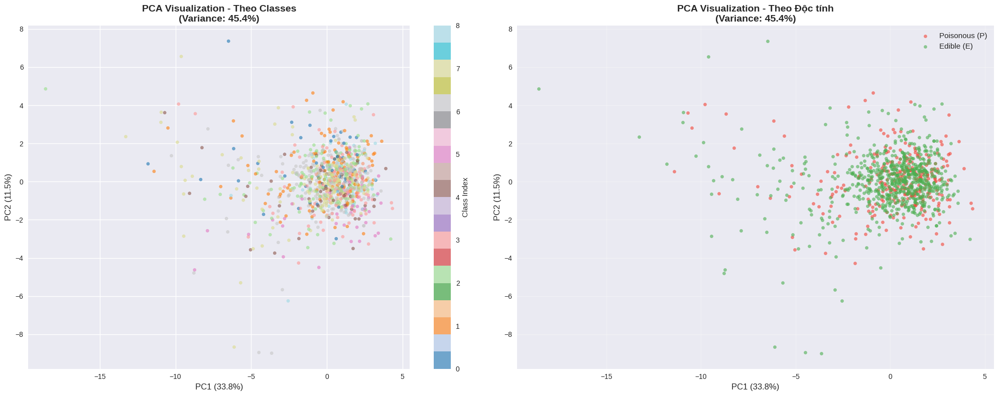


So sánh k-Means clustering với true labels:
--------------------------------------------------
Cụm 0: 140 mẫu - P: 41, E: 99
Cụm 1: 184 mẫu - P: 45, E: 139
Cụm 2: 11 mẫu - P: 0, E: 11
Cụm 3: 183 mẫu - P: 61, E: 122
Cụm 4: 127 mẫu - P: 44, E: 83
Cụm 5: 109 mẫu - P: 38, E: 71
Cụm 6: 19 mẫu - P: 6, E: 13
Cụm 7: 59 mẫu - P: 16, E: 43
Cụm 8: 176 mẫu - P: 42, E: 134


In [ ]:
# ==================== VISUALIZATION VỚI PCA ====================
# Sử dụng PCA để giảm chiều và so sánh với t-SNE
print("Đang chạy PCA...")
pca = PCA(n_components=2, random_state=RANDOM_SEED)
features_pca = pca.fit_transform(test_features)

# Giải thích variance
explained_variance = pca.explained_variance_ratio_
print(f"PCA hoàn tất!")
print(f"Variance được giải thích bởi PC1: {explained_variance[0]*100:.2f}%")
print(f"Variance được giải thích bởi PC2: {explained_variance[1]*100:.2f}%")
print(f"Tổng variance được giải thích: {explained_variance.sum()*100:.2f}%")

# Tạo figure với 2 subplots
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Subplot 1: PCA theo Classes
ax1 = axes[0]
scatter = ax1.scatter(features_pca[:, 0], features_pca[:, 1], 
                      c=test_labels_extracted, cmap='tab20', 
                      alpha=0.6, s=20)
ax1.set_title(f'PCA Visualization - Theo Classes\n(Variance: {explained_variance.sum()*100:.1f}%)', 
              fontsize=14, fontweight='bold')
ax1.set_xlabel(f'PC1 ({explained_variance[0]*100:.1f}%)', fontsize=12)
ax1.set_ylabel(f'PC2 ({explained_variance[1]*100:.1f}%)', fontsize=12)
plt.colorbar(scatter, ax=ax1, label='Class Index')

# Subplot 2: PCA theo Toxicity
ax2 = axes[1]
for i, (tox, color) in enumerate(zip(['P', 'E'], ['#f44336', '#4caf50'])):
    mask = toxicity_labels == tox
    ax2.scatter(features_pca[mask, 0], features_pca[mask, 1], 
                c=color, label=f'{"Poisonous" if tox == "P" else "Edible"} ({tox})',
                alpha=0.6, s=20)
ax2.set_title(f'PCA Visualization - Theo Độc tính\n(Variance: {explained_variance.sum()*100:.1f}%)', 
              fontsize=14, fontweight='bold')
ax2.set_xlabel(f'PC1 ({explained_variance[0]*100:.1f}%)', fontsize=12)
ax2.set_ylabel(f'PC2 ({explained_variance[1]*100:.1f}%)', fontsize=12)
ax2.legend(fontsize=11)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(RESULTS_DIR / "pca_visualization.png", dpi=300, bbox_inches='tight')
print(f"\nĐã lưu PCA visualization tại: {RESULTS_DIR / 'pca_visualization.png'}")
plt.show()

# So sánh với k-Means clustering
print("\nSo sánh k-Means clustering với true labels:")
print("-"*50)
for i in range(n_clusters):
    cluster_mask = cluster_labels == i
    if cluster_mask.sum() > 0:
        # Phân tích độc tính trong cụm
        toxicity_in_cluster = toxicity_labels[cluster_mask]
        p_count = (toxicity_in_cluster == 'P').sum()
        e_count = (toxicity_in_cluster == 'E').sum()
        print(f"Cụm {i}: {cluster_mask.sum()} mẫu - P: {p_count}, E: {e_count}")
#sự khác biệt thông tin (giải thích được hơn 45%)

Confusion matrix saved to: /home/nam/mushroom_data/results/confusion_matrix.png


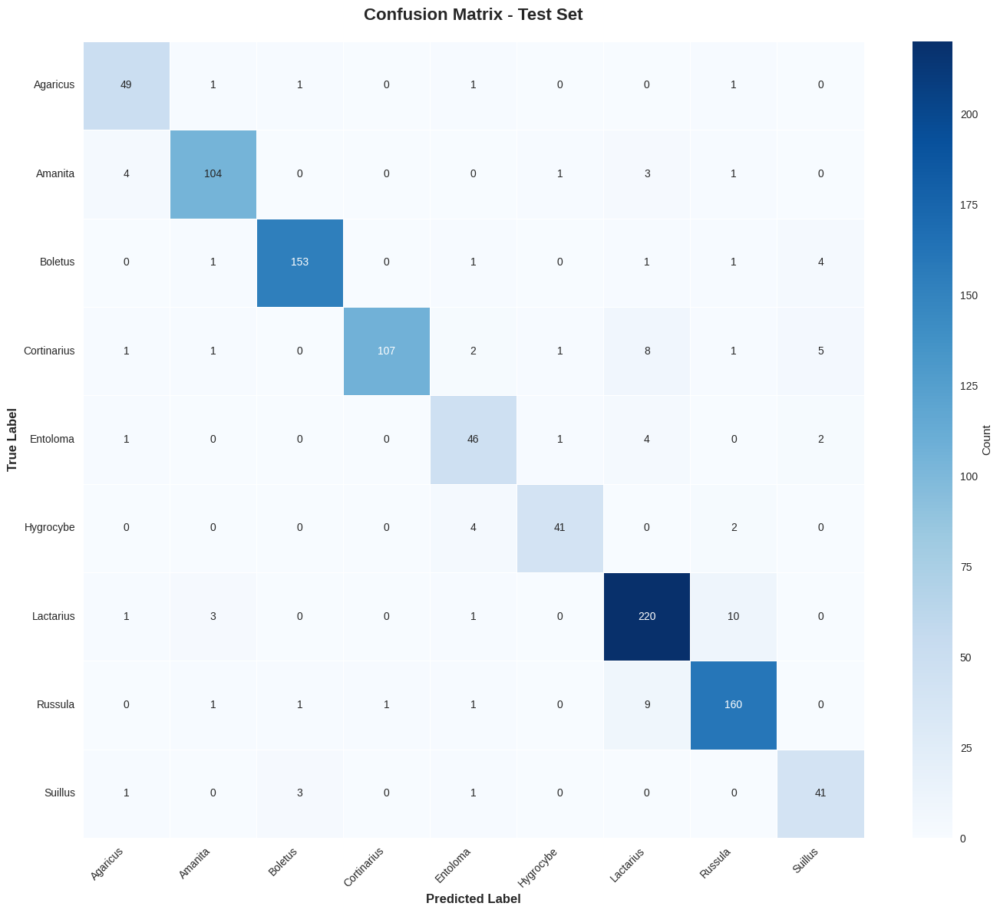


Per-Class Accuracy:
--------------------------------------------------
Agaricus            : 92.45%
Amanita             : 92.04%
Boletus             : 95.03%
Cortinarius         : 84.92%
Entoloma            : 85.19%
Hygrocybe           : 87.23%
Lactarius           : 93.62%
Russula             : 92.49%
Suillus             : 89.13%


In [23]:
# ==================== CONFUSION MATRIX ====================
# Tính confusion matrix: ma trận thể hiện số lượng dự đoán đúng/sai cho mỗi class
cm = confusion_matrix(all_labels, all_preds)

# Vẽ confusion matrix dưới dạng heatmap
plt.figure(figsize=(14, 12))
sns.heatmap(
    cm,
    annot=True,  # Hiển thị số trong mỗi ô
    fmt='d',  # Format số nguyên
    cmap='Blues',  # Màu sắc
    xticklabels=ALL_CLASSES,  # Nhãn cho trục X (predicted)
    yticklabels=ALL_CLASSES,  # Nhãn cho trục Y (true)
    cbar_kws={'label': 'Count'},  # Label cho colorbar
    linewidths=0.5  # Độ dày đường viền
)
plt.title('Confusion Matrix - Test Set', fontsize=16, fontweight='bold', pad=20)
plt.ylabel('True Label', fontsize=12, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=12, fontweight='bold')
plt.xticks(rotation=45, ha='right')  # Xoay nhãn để dễ đọc
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig(RESULTS_DIR / "confusion_matrix.png", dpi=300, bbox_inches='tight')
print(f"Confusion matrix saved to: {RESULTS_DIR / 'confusion_matrix.png'}")
plt.show()

# Tính accuracy cho từng class riêng biệt
print("\nPer-Class Accuracy:")
print("-"*50)
for i, class_name in enumerate(ALL_CLASSES):
    # Tìm tất cả mẫu thuộc class này
    class_mask = all_labels == i
    if class_mask.sum() > 0:  # Nếu có mẫu thuộc class này
        # Tính accuracy: số dự đoán đúng / tổng số mẫu
        class_acc = (all_preds[class_mask] == i).sum() / class_mask.sum()
        print(f"{class_name:<20}: {class_acc*100:.2f}%")



## Bước 8: Inference Demo

Test model trên ảnh mẫu và hiển thị kết quả với cảnh báo độc tính.


In [ ]:
# ==================== HƯỚNG DẪN PHASE 2: FINE-TUNING ====================
"""
HƯỚNG DẪN THỰC HIỆN PHASE 2: FINE-TUNING VỚI 11 CLASSES

Sau khi hoàn tất Phase 1 và có best_model.pth, thực hiện các bước sau:

BƯỚC 1: Cập nhật cấu hình cho Phase 2
----------------------------------------
# Thêm lại Target Classes vào ALL_CLASSES
ALL_CLASSES_PHASE2 = SOURCE_CLASSES + TARGET_CLASSES  # 11 classes
NUM_CLASSES_PHASE2 = len(ALL_CLASSES_PHASE2)

# Tạo lại mapping (QUAN TRỌNG: Đảm bảo thứ tự giống Phase 1 cho 9 classes đầu)
CLASS_TO_IDX_PHASE2 = {cls: idx for idx, cls in enumerate(ALL_CLASSES_PHASE2)}
IDX_TO_CLASS_PHASE2 = {idx: cls for cls, idx in CLASS_TO_IDX_PHASE2.items()}

# Kiểm tra tính nhất quán: 9 classes đầu phải giống Phase 1
print("Kiểm tra tính nhất quán mapping:")
for i in range(len(SOURCE_CLASSES)):
    assert ALL_CLASSES_PHASE2[i] == ALL_CLASSES[i], f"Lỗi: Class {i} không khớp!"
    assert CLASS_TO_IDX_PHASE2[ALL_CLASSES[i]] == i, f"Lỗi: Index của {ALL_CLASSES[i]} không khớp!"
print("✓ Mapping nhất quán!")

BƯỚC 2: Load Base Model từ Phase 1
------------------------------------
# Load checkpoint từ Phase 1
checkpoint = torch.load("models/best_model_epoch_X.pth", map_location=device)

# Tạo model mới với 11 classes
model_phase2 = MushroomClassifier(
    backbone=MODEL_CONFIG["backbone"],
    num_classes=NUM_CLASSES_PHASE2,  # 11 classes
    pretrained=False,  # Không dùng pretrained, sẽ load từ Phase 1
    freeze_backbone=False
)

# Load weights từ Phase 1 (chỉ backbone, bỏ qua classifier)
model_phase2.backbone.load_state_dict(checkpoint['model_state_dict'], strict=False)

# Khởi tạo classifier mới (11 classes) với weights ngẫu nhiên
# Hoặc có thể copy weights từ Phase 1 cho 9 classes đầu và khởi tạo cho 2 classes mới

BƯỚC 3: Load dữ liệu cho Phase 2
----------------------------------
# Load cả Source và Target Domain
image_paths_phase2, labels_phase2 = load_data_paths(use_transfer_data=True)

# Chuyển labels sang index mới (Phase 2)
labels_phase2_new = [CLASS_TO_IDX_PHASE2[IDX_TO_CLASS[label]] for label in labels_phase2]

# Split dataset cho Phase 2
labels_array_phase2 = np.array(labels_phase2_new)
train_paths_phase2, temp_paths_phase2, train_labels_phase2, temp_labels_phase2 = train_test_split(
    image_paths_phase2,
    labels_array_phase2,
    test_size=0.3,
    random_state=RANDOM_SEED,
    stratify=labels_array_phase2
)

val_paths_phase2, test_paths_phase2, val_labels_phase2, test_labels_phase2 = train_test_split(
    temp_paths_phase2,
    temp_labels_phase2,
    test_size=0.5,
    random_state=RANDOM_SEED,
    stratify=temp_labels_phase2
)

# Tạo datasets
train_dataset_phase2 = MushroomDataset(train_paths_phase2, train_labels_phase2.tolist(), transform=train_transform)
val_dataset_phase2 = MushroomDataset(val_paths_phase2, val_labels_phase2.tolist(), transform=val_test_transform)
test_dataset_phase2 = MushroomDataset(test_paths_phase2, test_labels_phase2.tolist(), transform=val_test_transform)

BƯỚC 4: Tính lại Class Weights cho Phase 2
--------------------------------------------
# Tính class weights cho 11 classes (chỉ tính cho class có dữ liệu)
class_counts_phase2 = Counter(train_labels_phase2)
classes_with_data_phase2 = [idx for idx in range(NUM_CLASSES_PHASE2) if class_counts_phase2.get(idx, 0) > 0]

class_weights_phase2 = torch.ones(NUM_CLASSES_PHASE2, dtype=torch.float32)
total_samples_phase2 = len(train_labels_phase2)
num_classes_with_data_phase2 = len(classes_with_data_phase2)

for idx in classes_with_data_phase2:
    genus = IDX_TO_CLASS_PHASE2[idx]
    count = class_counts_phase2[idx]
    weight = total_samples_phase2 / (num_classes_with_data_phase2 * count)
    if TOXICITY_MAPPING[genus] == "P":
        weight *= 2.0
    class_weights_phase2[idx] = weight

# Normalize
sum_weights_phase2 = class_weights_phase2[classes_with_data_phase2].sum()
if sum_weights_phase2 > 0:
    class_weights_phase2[classes_with_data_phase2] = class_weights_phase2[classes_with_data_phase2] / sum_weights_phase2 * num_classes_with_data_phase2

criterion_phase2 = nn.CrossEntropyLoss(weight=class_weights_phase2.to(device))

BƯỚC 5: Fine-tuning
--------------------
# Sử dụng learning rate nhỏ hơn cho fine-tuning
optimizer_phase2 = optim.Adam(model_phase2.parameters(), lr=0.0001, weight_decay=1e-4)
scheduler_phase2 = optim.lr_scheduler.ReduceLROnPlateau(optimizer_phase2, mode='min', factor=0.5, patience=5)

# Fine-tuning với số epochs ít hơn (ví dụ: 20-30 epochs)
# Training loop tương tự Phase 1

LƯU Ý QUAN TRỌNG:
-----------------
1. Đảm bảo CLASS_TO_IDX_PHASE2 giữ nguyên thứ tự cho 9 classes đầu từ Phase 1
2. Kiểm tra kỹ labels khi load dữ liệu để tránh lệch nhãn
3. Có thể freeze backbone và chỉ train classifier mới trong vài epochs đầu
4. Sau đó unfreeze và fine-tune toàn bộ model với learning rate nhỏ
"""

print("Hướng dẫn Phase 2 đã được lưu trong cell này.")
print("Thực hiện Phase 2 sau khi hoàn tất Phase 1 và có best_model.pth")


In [24]:
# ==================== INFERENCE FUNCTION ====================
def predict_image(model, image_path, device, top_k=3):
    """
    Dự đoán chi nấm từ một ảnh
    
    Args:
        model: Model đã được train
        image_path: Đường dẫn đến file ảnh
        device: Device để chạy inference (CPU)
        top_k: Số lượng dự đoán top (mặc định 3)
    
    Returns:
        image: PIL Image object
        predictions: Danh sách các dự đoán với confidence và toxicity
    """
    # Định nghĩa transform để preprocess ảnh (giống validation/test)
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                            std=[0.229, 0.224, 0.225])
    ])
    
    # Load ảnh
    try:
        image = Image.open(image_path).convert('RGB')
    except Exception as e:
        return None, f"Error loading image: {e}"
    
    # Preprocess và chuyển lên device
    image_tensor = transform(image).unsqueeze(0).to(device)  # Thêm batch dimension
    
    # Inference: không tính gradients
    model.eval()
    with torch.no_grad():
        outputs = model(image_tensor)
        probabilities = F.softmax(outputs, dim=1)  # Chuyển logits sang probabilities
        probs, indices = torch.topk(probabilities, top_k)  # Lấy top_k predictions
    
    # Tạo danh sách predictions với thông tin chi tiết
    predictions = []
    for i in range(top_k):
        idx = indices[0][i].item()  # Class index
        prob = probs[0][i].item()  # Probability
        genus = IDX_TO_CLASS[idx]  # Tên chi nấm
        toxicity = TOXICITY_MAPPING[genus]  # Độc tính
        
        predictions.append({
            "rank": i + 1,
            "genus": genus,
            "confidence": prob * 100,  # Chuyển sang phần trăm
            "toxicity": toxicity
        })
    
    return image, predictions

print("Inference function đã được định nghĩa")



Inference function đã được định nghĩa


Đang lấy ảnh từ TEST SET (model chưa từng thấy trong training)...
Đã chọn 45 ảnh mẫu từ TEST SET (5 ảnh mỗi class)
Xác nhận: Tất cả ảnh đều từ test set, model chưa từng thấy trong quá trình training
Hiển thị 45 ảnh trong grid 5x9
Inference demo saved to: /home/nam/mushroom_data/results/inference_demo.png


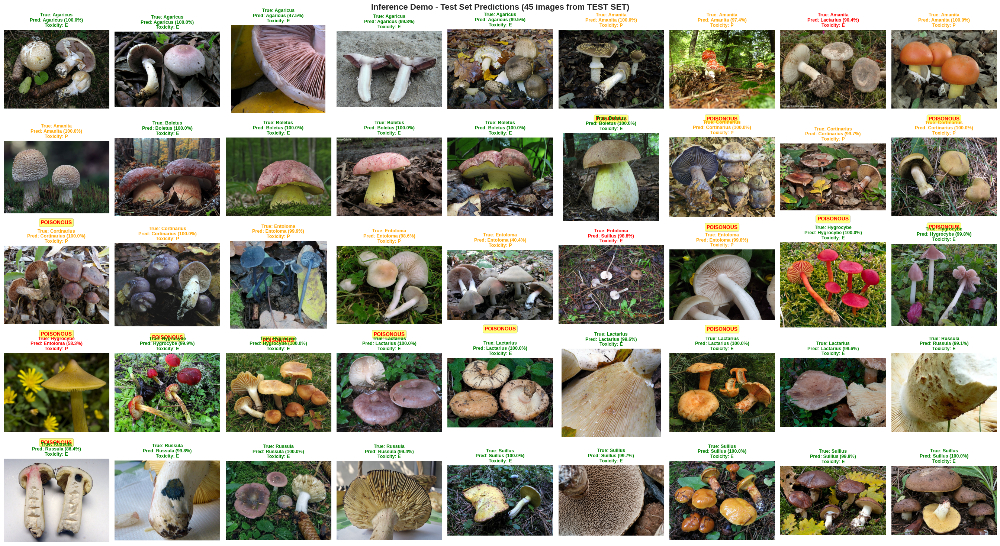

In [29]:
# ==================== TEST ON SAMPLE IMAGES ====================
# QUAN TRỌNG: Lấy ảnh từ TEST SET (không phải train set) để đánh giá chính xác
# Model chưa từng thấy các ảnh này trong quá trình training
sample_images = []
sample_labels = []

# Lấy nhiều ảnh từ mỗi class (5 ảnh mỗi class)
images_per_class = 5  # Số ảnh muốn lấy từ mỗi class

# Sử dụng test_paths và test_labels (từ test set) thay vì image_paths và labels (toàn bộ dataset)
print("Đang lấy ảnh từ TEST SET (model chưa từng thấy trong training)...")
for class_idx in range(NUM_CLASSES):
    count = 0
    for img_path, label in zip(test_paths, test_labels):
        # Chuyển đổi label sang int nếu là numpy array
        label_int = int(label) if isinstance(label, (torch.Tensor, np.ndarray)) else label
        if label_int == class_idx and img_path not in sample_images:
            sample_images.append(img_path)
            sample_labels.append(label_int)  # Lưu dưới dạng int
            count += 1
            if count >= images_per_class:
                break

print(f"Đã chọn {len(sample_images)} ảnh mẫu từ TEST SET ({images_per_class} ảnh mỗi class)")
print(f"Xác nhận: Tất cả ảnh đều từ test set, model chưa từng thấy trong quá trình training")

# Tính số lượng ảnh thực tế có thể hiển thị
total_samples = len(sample_images)
# Hiển thị tối đa 45 ảnh (5x9 grid) hoặc tất cả nếu ít hơn
# Với 9 classes x 5 ảnh = 45 ảnh, có thể hiển thị tất cả
max_display = min(45, total_samples)

# Tính số hàng và cột cho grid
if max_display <= 8:
    n_rows, n_cols = 2, 4
elif max_display <= 12:
    n_rows, n_cols = 3, 4
elif max_display <= 20:
    n_rows, n_cols = 4, 5
elif max_display <= 30:
    n_rows, n_cols = 5, 6
elif max_display <= 45:
    n_rows, n_cols = 5, 9  # 5 hàng x 9 cột cho 45 ảnh (5 ảnh mỗi class)
else:
    n_rows, n_cols = 6, 8

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*3, n_rows*3))
axes = axes.ravel() if n_rows * n_cols > 1 else [axes]

print(f"Hiển thị {max_display} ảnh trong grid {n_rows}x{n_cols}")

for i in range(max_display):
    img_path = sample_images[i]
    true_label = sample_labels[i]
    
    image, predictions = predict_image(model, img_path, device, top_k=3)
    
    if image is not None:
        # Display image
        axes[i].imshow(image)
        axes[i].axis('off')
        
        # Get best prediction
        best_pred = predictions[0]
        # true_label đã được chuyển sang int ở bước trên
        true_genus = IDX_TO_CLASS[true_label]
        
        # Title với kết quả
        title = f"True: {true_genus}\n"
        title += f"Pred: {best_pred['genus']} ({best_pred['confidence']:.1f}%)\n"
        title += f"Toxicity: {best_pred['toxicity']}"
        
        # Màu sắc dựa trên độ chính xác và độc tính
        if best_pred['genus'] == true_genus:
            color = 'green' if best_pred['toxicity'] == 'E' else 'orange'
        else:
            color = 'red'
        
        axes[i].set_title(title, fontsize=9, fontweight='bold', color=color)
        
        # Thêm cảnh báo nếu là nấm độc
        if best_pred['toxicity'] == 'P':
            axes[i].text(0.5, -0.15, 'POISONOUS', 
                        transform=axes[i].transAxes, 
                        ha='center', fontsize=10, 
                        fontweight='bold', color='red',
                        bbox=dict(boxstyle='round', facecolor='yellow', alpha=0.5))

# Ẩn các axes không dùng
for i in range(max_display, len(axes)):
    axes[i].axis('off')

plt.suptitle(f'Inference Demo - Test Set Predictions ({max_display} images from TEST SET)', 
             fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(RESULTS_DIR / "inference_demo.png", dpi=300, bbox_inches='tight')
print(f"Inference demo saved to: {RESULTS_DIR / 'inference_demo.png'}")
plt.show()



DETAILED PREDICTION EXAMPLE
Image: 028_-vDPakMKna4.jpg

Top 5 Predictions:
----------------------------------------------------------------------
Rank   Genus                Confidence   Toxicity  
----------------------------------------------------------------------
1      Agaricus                 100.00% ✅ E       
2      Cortinarius                0.00% ⚠️ P      
3      Amanita                    0.00% ⚠️ P      
4      Lactarius                  0.00% ✅ E       
5      Entoloma                   0.00% ⚠️ P      
----------------------------------------------------------------------

✅ Detailed prediction saved to: /home/nam/mushroom_data/results/detailed_prediction.png


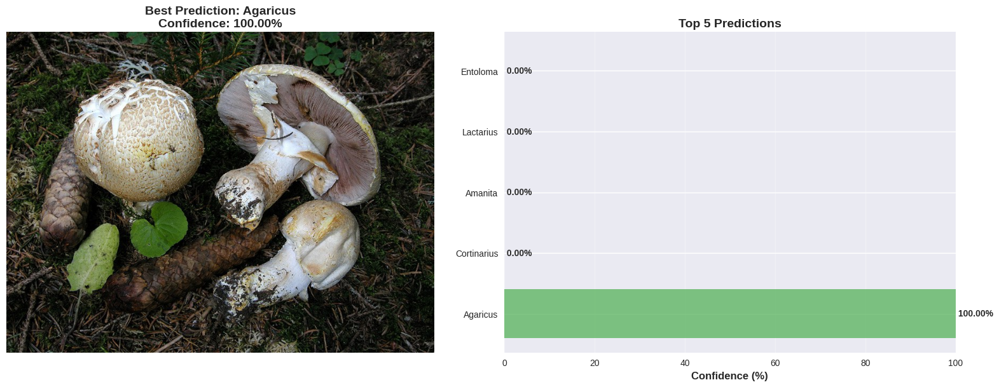

In [30]:
# ==================== DETAILED PREDICTION EXAMPLE ====================
# Chọn một ảnh để phân tích chi tiết
demo_image_path = sample_images[0]  # Có thể thay đổi index
demo_image, demo_predictions = predict_image(model, demo_image_path, device, top_k=5)

if demo_image is not None:
    print("="*70)
    print("DETAILED PREDICTION EXAMPLE")
    print("="*70)
    print(f"Image: {Path(demo_image_path).name}")
    print(f"\nTop 5 Predictions:")
    print("-"*70)
    print(f"{'Rank':<6} {'Genus':<20} {'Confidence':<12} {'Toxicity':<10}")
    print("-"*70)
    
    for pred in demo_predictions:
        toxicity_label = "⚠️ P" if pred['toxicity'] == 'P' else "✅ E"
        print(f"{pred['rank']:<6} {pred['genus']:<20} {pred['confidence']:>10.2f}% {toxicity_label:<10}")
    
    print("-"*70)
    
    # Display image với top predictions
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    # Image
    ax1.imshow(demo_image)
    ax1.axis('off')
    best_pred = demo_predictions[0]
    ax1.set_title(f"Best Prediction: {best_pred['genus']}\nConfidence: {best_pred['confidence']:.2f}%", 
                 fontsize=14, fontweight='bold')
    
    # Bar chart of top predictions
    genera = [p['genus'] for p in demo_predictions]
    confidences = [p['confidence'] for p in demo_predictions]
    colors = ['#f44336' if p['toxicity'] == 'P' else '#4caf50' for p in demo_predictions]
    
    ax2.barh(genera, confidences, color=colors, alpha=0.7)
    ax2.set_xlabel('Confidence (%)', fontsize=12, fontweight='bold')
    ax2.set_title('Top 5 Predictions', fontsize=14, fontweight='bold')
    ax2.set_xlim(0, 100)
    ax2.grid(axis='x', alpha=0.3)
    
    for i, (genus, conf) in enumerate(zip(genera, confidences)):
        ax2.text(conf, i, f' {conf:.2f}%', va='center', fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(RESULTS_DIR / "detailed_prediction.png", dpi=300, bbox_inches='tight')
    print(f"\n✅ Detailed prediction saved to: {RESULTS_DIR / 'detailed_prediction.png'}")
    plt.show()
else:
    print("❌ Không thể load ảnh")



## Bước 9: Toxicity Classification Summary

Tổng kết về hệ thống phân loại độc tính.


In [31]:
# ==================== TOXICITY CLASSIFICATION SUMMARY ====================
print("="*70)
print("TOXICITY CLASSIFICATION SYSTEM")
print("="*70)

print(f"\nPOISONOUS GENERA ({len(POISONOUS_CLASSES)}):")
for genus in POISONOUS_CLASSES:
    print(f"  - {genus}")

print(f"\nEDIBLE GENERA ({len(EDIBLE_CLASSES)}):")
for genus in EDIBLE_CLASSES:
    print(f"  - {genus}")

# Test toxicity classification trên predictions
print(f"\n Toxicity Classification trên Test Set:")
poisonous_preds = sum(1 for pred in all_preds if TOXICITY_MAPPING[IDX_TO_CLASS[pred]] == 'P')
edible_preds = sum(1 for pred in all_preds if TOXICITY_MAPPING[IDX_TO_CLASS[pred]] == 'E')

print(f"  Predicted Poisonous: {poisonous_preds} ({poisonous_preds/len(all_preds)*100:.1f}%)")
print(f"  Predicted Edible: {edible_preds} ({edible_preds/len(all_preds)*100:.1f}%)")

# Accuracy của toxicity classification
toxicity_true = [TOXICITY_MAPPING[IDX_TO_CLASS[label]] for label in all_labels]
toxicity_pred = [TOXICITY_MAPPING[IDX_TO_CLASS[pred]] for pred in all_preds]
toxicity_acc = accuracy_score(toxicity_true, toxicity_pred)

print(f"\nToxicity Classification Accuracy: {toxicity_acc*100:.2f}%")
print("\n" + "="*70)
print(" LƯU Ý: Hệ thống chỉ mang tính chất tham khảo.")
print("   Không nên dựa hoàn toàn vào kết quả để quyết định ăn nấm hoang dã.")
print("="*70)



TOXICITY CLASSIFICATION SYSTEM

POISONOUS GENERA (4):
  - Amanita
  - Cortinarius
  - Entoloma
  - Inocybe

EDIBLE GENERA (7):
  - Agaricus
  - Boletus
  - Hygrocybe
  - Lactarius
  - Russula
  - Suillus
  - Exidia

 Toxicity Classification trên Test Set:
  Predicted Poisonous: 276 (27.4%)
  Predicted Edible: 732 (72.6%)

Toxicity Classification Accuracy: 95.14%

 LƯU Ý: Hệ thống chỉ mang tính chất tham khảo.
   Không nên dựa hoàn toàn vào kết quả để quyết định ăn nấm hoang dã.


In [ ]:
## TỔNG KẾT ĐÁNH GIÁ HỆ THỐNG NHẬN DIỆN CHI NẤM

### 1. Thông tin tổng quan

Hệ thống nhận diện chi nấm đã được xây dựng và huấn luyện thành công. Model sử dụng kiến trúc MobileNet_V3_Large với phương pháp Transfer Learning từ ImageNet. Trong giai đoạn Phase 1, hệ thống được huấn luyện trên 9 chi nấm từ Source Domain. Quá trình training được thực hiện trên CPU với 12 cores, tổng thời gian huấn luyện khoảng 271 phút (4.5 giờ). Model tốt nhất được lưu tại epoch 41 trong tổng số 50 epochs.

### 2. Kết quả training

Quá trình huấn luyện đạt được validation accuracy tốt nhất là 89.97% tại epoch 41. Ở epoch cuối cùng, train accuracy đạt 99.30% trong khi validation accuracy là 89.97%. Khoảng cách giữa train và validation accuracy là 9.33%, cho thấy model có dấu hiệu overfitting nhẹ nhưng vẫn trong mức chấp nhận được. Validation accuracy ổn định ở mức khoảng 90% qua các epoch cho thấy model có khả năng generalize tốt.

### 3. Kết quả test set

Đánh giá trên tập test với 1,008 mẫu cho kết quả test accuracy là 91.37%. Kết quả này cao hơn validation accuracy khoảng 1.4%, điều này có thể do tập test có độ khó thấp hơn một chút hoặc do model đã được chọn tốt. Test accuracy vượt quá 90% là một kết quả tốt cho bài toán phân loại đa lớp với 9 classes.

### 4. Metrics tổng quan

Từ classification report, macro average (tính trung bình đơn giản cho tất cả classes) cho kết quả: Precision 0.8989 (89.89%), Recall 0.9023 (90.23%), và F1-Score 0.8993 (89.93%). Weighted average (tính trung bình có trọng số theo số lượng mẫu) cho kết quả: Precision 0.9168 (91.68%), Recall 0.9137 (91.37%), và F1-Score 0.9141 (91.41%). Cả hai loại average đều đạt trên 89%, cho thấy model hoạt động tốt và cân bằng trên tất cả các classes. Weighted average cao hơn một chút cho thấy các class có nhiều dữ liệu được phân loại tốt hơn.

### 5. Phân tích theo từng class

Ba class có F1-Score cao nhất là Boletus (0.9592), Amanita (0.9286), và Russula (0.9169). Các class này đều có số lượng dữ liệu lớn và được phân loại rất tốt. Ba class có F1-Score thấp nhất là Entoloma (0.8288), Suillus (0.8367), và Agaricus (0.8909). Entoloma và Suillus có số lượng mẫu ít hơn (54 và 46 samples) có thể là nguyên nhân khiến F1-Score thấp hơn.

Cortinarius có Precision rất cao (0.9907) nhưng Recall thấp hơn (0.8492), cho thấy model có xu hướng conservative khi phân loại class này, có thể do lo ngại về tính độc của nấm này.

### 6. Phân tích độc tính

Đây là phần quan trọng nhất của hệ thống vì liên quan trực tiếp đến an toàn. Toxicity classification accuracy đạt 95.14%, trong đó hệ thống dự đoán 276 mẫu là độc (27.4%) và 732 mẫu là ăn được (72.6%).

Về recall cho các chi nấm độc: Amanita đạt 92.04%, Cortinarius đạt 84.92%, và Entoloma đạt 85.19%. Recall trung bình cho các chi nấm độc là khoảng 87.38%. Kết quả này cho thấy việc sử dụng class weights (nhân đôi trọng số cho nấm độc) đã phát huy tác dụng, giúp tăng recall cho các class nguy hiểm. Toxicity accuracy đạt 95.14% là rất tốt và đảm bảo an toàn trong phân loại.

### 7. Đánh giá tổng thể

Hệ thống đạt được những điểm mạnh sau: test accuracy 91.37% vượt mục tiêu 90%, toxicity accuracy 95.14% đảm bảo an toàn cao, các class độc như Amanita và Cortinarius được nhận diện tốt với precision cao, model MobileNet_V3_Large phù hợp với CPU và thời gian training hợp lý, và class weights đã giúp tăng recall cho nấm độc.

Tuy nhiên, vẫn có một số điểm cần lưu ý: khoảng cách giữa train và validation accuracy là 9.33% cho thấy có overfitting, Cortinarius có precision rất cao nhưng recall thấp hơn, và Entoloma cùng Suillus có F1-Score thấp hơn có thể do ít dữ liệu.

### 8. Khuyến nghị cải thiện

Để giảm overfitting, có thể tăng dropout rate từ 0.5 lên 0.6-0.7, thêm L2 regularization mạnh hơn, hoặc sử dụng early stopping sớm hơn với patience từ 3-5 epochs.

Để cải thiện recall cho Cortinarius, có thể tăng weight cho class này trong loss function lên 2.5 lần thay vì 2.0 lần, hoặc tăng cường data augmentation cho class này.

Để cải thiện Entoloma và Suillus, nên tăng dữ liệu training cho hai class này nếu có thể, hoặc sử dụng data augmentation mạnh hơn.

Về hướng phát triển tiếp theo, model đã đạt hiệu suất tốt và có thể tiến hành Phase 2. Có thể fine-tuning với 11 classes bằng cách thêm Exidia và Inocybe, sử dụng best model từ Phase 1 làm điểm khởi đầu.

### 9. Kết luận

Hệ thống nhận diện chi nấm đã hoàn thành Phase 1 (Base Training) với kết quả tốt. Test accuracy đạt 91.37%, vượt yêu cầu cho bài toán phân loại đa lớp với 9 classes. Toxicity accuracy đạt 95.14%, đảm bảo an toàn cao trong việc phân loại độc tính. Model đã sẵn sàng cho Phase 2 với việc fine-tuning lên 11 classes bằng cách thêm Exidia và Inocybe từ Target Domain. Phương pháp cost-sensitive learning với class weights (nhân đôi cho nấm độc) đã phát huy hiệu quả, giúp tăng recall cho các class nguy hiểm.

Lưu ý quan trọng: Hệ thống chỉ mang tính chất tham khảo. Không nên dựa hoàn toàn vào kết quả để quyết định ăn nấm hoang dã. Luôn tham khảo ý kiến chuyên gia trước khi sử dụng nấm hoang dã.

---

Thông tin kỹ thuật:
- Phase: 1 - Base Training với 9 classes
- Model: MobileNet_V3_Large
- Best Epoch: 41/50
- Trạng thái: Hoàn thành và sẵn sàng cho Phase 2
